In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Import Libraries


In [2]:
!pip install torch_geometric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 78.1 MB/s eta 0:00:00


In [3]:
import cv2
import zipfile
import numpy as np
import pandas as pd
import os, glob
import random
from tqdm import tqdm
from skimage.measure import shannon_entropy
import matplotlib.pyplot as plt
import torch
from PIL import Image
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms

### Original Path

In [4]:
base_path = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel"

drive_train_img_dir  = f"{base_path}/DRIVE/training/images"
drive_train_mask_dir = f"{base_path}/DRIVE/training/mask"
drive_train_gt_dir = f"{base_path}/DRIVE/training/1st_manual"

drive_test_img_dir   = f"{base_path}/DRIVE/test/images"
drive_test_mask_dir  = f"{base_path}/DRIVE/test/mask"
drive_test_gt_dir = f"{base_path}/DRIVE/test/1st_manual"

stare_img_dir   = f"{base_path}/STARE/pngdata"
stare_gt_vk  = f"{base_path}/STARE/pnglabel_vk"
stare_gt_ah  = f"{base_path}/STARE/pnglabel_ah"

In [5]:
BASE_PATH = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel"

DATASETS = {
    "DRIVE": {
        "train_images": f"{BASE_PATH}/DRIVE_preprocess/train/images",
        "train_labels": f"{BASE_PATH}/DRIVE_preprocess/train/labels",
        "test_images":  f"{BASE_PATH}/DRIVE_preprocess/test/images",
        "test_labels":  f"{BASE_PATH}/DRIVE_preprocess/test/labels",
    }, # size: 565 × 584
    "STARE": {
        "train_images": f"{BASE_PATH}/STARE_process/train/images",
        "train_labels": f"{BASE_PATH}/STARE_process/train/labels",
        "test_images":  f"{BASE_PATH}/STARE_process/test/images",
        "test_labels":  f"{BASE_PATH}/STARE_process/test/labels",
    }, # size: 700 × 605
}

### Utils Function

#### For preprocessing

In [ ]:
# import shutil, os

# drive_dir = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/DRIVE_preprocess"
# shutil.rmtree(drive_dir, ignore_errors=True)
# os.makedirs(f"{drive_dir}/train/images")
# os.makedirs(f"{drive_dir}/train/labels")
# os.makedirs(f"{drive_dir}/val/images")
# os.makedirs(f"{drive_dir}/val/labels")
# os.makedirs(f"{drive_dir}/test/images")
# os.makedirs(f"{drive_dir}/test/labels")

In [ ]:
# stare_dir = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/STARE_preprocess"
# shutil.rmtree(stare_dir, ignore_errors=True)
# os.makedirs(f"{stare_dir}/train/images")
# os.makedirs(f"{stare_dir}/train/labels")
# os.makedirs(f"{stare_dir}/val/images")
# os.makedirs(f"{stare_dir}/val/labels")
# os.makedirs(f"{stare_dir}/test/images")
# os.makedirs(f"{stare_dir}/test/labels")

In [6]:
def zscore_normalize(image, mask=None):
    """
    Chuẩn hoá ảnh theo z-score: n_i = (x_i - l_i) / r_i,
    sau đó scale về [0, 1] để mô hình học ổn định.
    """
    img = image.astype(np.float32)
    # Tính mean và std trong vùng FOV
    if mask is not None:
        fov = img[mask > 0]
        mean, std = np.mean(fov), np.std(fov)
    else:
        mean, std = np.mean(img), np.std(img)
    # Áp dụng chuẩn hoá z-score
    img_z = (img - mean) / (std + 1e-8)
    # Scale kết quả về [0, 1]
    img_min, img_max = img_z.min(), img_z.max()
    img_norm = (img_z - img_min) / (img_max - img_min + 1e-8)
    return img_norm

def apply_CLAHE(image, clip_limit=1.5, tile_grid_size=(8, 8)):
    """
    Tăng tương phản cục bộ bằng CLAHE
    Params:
    - clip_limit: giới hạn contrast tăng thêm trong từng grid đc chỉ định.
    càng lớn -> ảnh sắc nhưng cũng dễ nhiễu
    - tile_grid_size: kích thước grid để áp dụng CLAHE
    lưới nhỏ -> bắt được mạch máu nhỏ
    """
    if image.dtype != np.uint8:
        image = np.clip(image, 0, 255).astype(np.uint8)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    return clahe.apply(image)

def modified_tophat_transform(image, G_size, Gp_size):
    """Modified White & Black Top-hat"""
    G  = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (G_size, G_size)) # bắt mạch máu ngắn/nhỏ
    Gp = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (Gp_size, Gp_size)) # làm mượt nền khi lấy top-hat

    MWTH = image - cv2.dilate(cv2.erode(image, G), Gp) # white top-hat
    # white top-hat làm nổi phần sáng mảnh -> mạch máu sáng
    MBTH = cv2.erode(cv2.dilate(image, G), Gp) - image # black top-hat
    # black top-hat làm nổi phần tối -> mạch máu trên nền sáng
    return MWTH, MBTH

def multiscale_tophat_entropy(image, mask=None, n=8, w=0.25, G0=3, Gp0=13):
    """
    Multi-scale Top-hat theo Entropy 2019
    Params:
    - n = 8: số scale dùng để bắt mạch máu từ nhỏ -> lớn. n càng lớn, ảnh sắc hơn, noise cx tăng
    - w = 0.25: trọng số giữa MWTH và MBTH (tăng cường tương phản mạch máu)
    - G0 = 3: kích thước kernel cho MWTH
    - Gp0 = 13: kích thước kernel cho MBTH
    """
    I = image.astype(np.float32)
    if mask is None:
        mask = np.ones_like(image, np.uint8)

    MB, MD = [], []
    for i in range(1, n+1):
        G_size = G0 + 2*(i-1) # tăng theo scale, receptive field lớn dần
        Gp_size = Gp0 + 2*(i-1)
        mw, mb = modified_tophat_transform(I, G_size, Gp_size)
        MB.append(mw)
        MD.append(mb)

    # tạo các dải biên bộ
    SNBS = [MB[i] - MB[i-1] for i in range(1, n)]
    SNDS = [MD[i] - MD[i-1] for i in range(1, n)]
    # tổng hợp đa mức
    SMB = np.sum(MB, axis=0)
    SMD = np.sum(MD, axis=0)
    SSNBS = np.sum(SNBS, axis=0)
    SSNDS = np.sum(SNDS, axis=0)
    # ct tham khảo từ bài báo
    IE = I + w*(SMB + SSNBS) - w*(SMD + SSNDS)
    # clip kết quả
    IE = np.clip(IE, 0, 255).astype(np.uint8)
    IE = cv2.bitwise_and(IE, IE, mask=mask)
    return IE

def visualize_random_samples(img_dir, lbl_dir, n=5, title_prefix="Train"):
    """
    Hàm hiển thị ngẫu nhiên n ảnh
    """
    img_files = sorted(os.listdir(img_dir))
    sample_files = random.sample(img_files, min(n, len(img_files)))

    plt.figure(figsize=(10, n * 3))
    for i, f in enumerate(sample_files):
        img_path = os.path.join(img_dir, f)
        lbl_path = os.path.join(lbl_dir, f.replace("_prep", "_gt"))

        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        lbl = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)

        plt.subplot(n, 2, 2*i + 1)
        plt.imshow(img, cmap="gray")
        plt.title(f"{title_prefix} Fundus: {f}")
        plt.axis("off")
        plt.subplot(n, 2, 2*i + 2)
        plt.imshow(lbl, cmap="gray")
        plt.title(f"{title_prefix} GT: {f.replace('_prep','_gt')}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

#### For model training

In [7]:
def initialize_weights(*models):
    for model in models:
        for module in model.modules():
            if isinstance(module, nn.Conv2d) or isinstance(module, nn.Linear):
                nn.init.kaiming_normal_(module.weight)
                if module.bias is not None:
                    module.bias.data.zero_()
            elif isinstance(module, nn.BatchNorm2d):
                module.weight.data.fill_(1)
                module.bias.data.zero_()

def dice_loss(pred, target, smooth=1e-6):
    pred = torch.sigmoid(pred)  # chuyển logits → xác suất
    # flatten
    pred = pred.view(-1)
    target = target.view(-1)
    # overlap
    intersection = (pred * target).sum()
    return 1 - ((2. * intersection + smooth) / (pred.sum() + target.sum() + smooth))

#### For saving probability vessel maps

In [8]:
def generate_probability_map(model, dataset, img_file, device=None, batch_size=8):
    """
    Sinh bản đồ xác suất mạch máu (H,W) ∈ [0,1]
    """
    if device is None:
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    else:
        device = torch.device(device)

    model.to(device)
    model.eval()

    img_path = os.path.join(dataset.img_dir, img_file)
    img0 = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img0 is None:
        raise FileNotFoundError(img_path)
    H, W = img0.shape

    prob_acc = np.zeros((H, W), dtype=np.float32)
    count_acc = np.zeros((H, W), dtype=np.float32)

    patch_infos = [p for p in dataset.base_patches if p['img_file'] == img_file]
    if len(patch_infos) == 0:
        raise ValueError("No patches found for image: " + img_file)

    items = []
    for info in patch_infos:
        y, x = int(info['y']), int(info['x'])
        img_exp = dataset._get_expanded_patch(img0, y, x).astype(np.float32) / 255.0
        if img_exp.shape != (dataset.expanded, dataset.expanded):
            img_exp = cv2.resize(img_exp, (dataset.expanded, dataset.expanded))
        clip = (y, y + dataset.patch_size, x, x + dataset.patch_size)
        items.append((img_exp, clip))

    with torch.no_grad():
        for i in range(0, len(items), batch_size):
            batch = items[i:i+batch_size]
            imgs = np.stack([b[0] for b in batch], axis=0)
            imgs_t = torch.from_numpy(imgs).unsqueeze(1).float().to(device)
            logits = model(imgs_t)                       # [B,1,388,388]
            probs = torch.sigmoid(logits).cpu().numpy()  # sigmoid thay vì softmax

            for bi, (_, clip) in enumerate(batch):
                y0, y1, x0, x1 = clip
                ph, pw = y1 - y0, x1 - x0
                prob_patch = probs[bi, 0, :, :]
                prob_crop = prob_patch[:ph, :pw]
                prob_acc[y0:y1, x0:x1] += prob_crop
                count_acc[y0:y1, x0:x1] += 1.0

    mask = count_acc > 0
    prob_map = np.zeros_like(prob_acc, dtype=np.float32)
    prob_map[mask] = prob_acc[mask] / count_acc[mask]
    if prob_map.shape != img0.shape:
        prob_map = cv2.resize(prob_map, (img0.shape[1], img0.shape[0]), interpolation=cv2.INTER_CUBIC)
    return prob_map

def save_prob_map(prob_map, out_path, ref_image_path=None, save_npy=True, save_png=True):
    """
    Lưu bản đồ xác suất mạch máu:
      - .png để trực quan (8-bit)
      - .npy để dùng cho GNN (float32)
    """
    # Đảm bảo phần mở rộng hợp lệ
    base, ext = os.path.splitext(out_path)
    if ext == "":
        out_path = base + ".png"  # mặc định PNG nếu không có đuôi

    # Resize để khớp với ảnh tham chiếu (nếu có)
    if ref_image_path is not None:
        ref = cv2.imread(ref_image_path, cv2.IMREAD_GRAYSCALE)
        if ref is not None and prob_map.shape != ref.shape:
            prob_map = cv2.resize(
                prob_map, (ref.shape[1], ref.shape[0]), interpolation=cv2.INTER_CUBIC
            )

    # Lưu file .png cho visualization
    if save_png:
        vis = (np.clip(prob_map, 0.0, 1.0) * 255.0).astype(np.uint8)
        png_path = base + ".png"
        cv2.imwrite(png_path, vis)

    # Lưu file .npy cho GNN (float32)
    if save_npy:
        npy_path = base + ".npy"
        np.save(npy_path, prob_map)

    print(f"Saved prob map: {base} (.png + .npy)")


### Data preprocessing


Pipeline tiền xử lý dữ liệu: ảnh fundus -> vùng FOV (nếu có mark) -> ảnh grayscale -> MTHT -> CLAHE -> normalize [0,1]

#### Apply for DRIVE (pipeline)

In [9]:
def preprocess_drive_with_gt(img_dir, mask_dir, gt_dir, save_dir):
    """
    Tiền xử lý cho DRIVE:
    - Ảnh fundus .tif (RGB)
    - Mask FOV .gif
    - Ground truth .gif
    - Ảnh xám được tính theo trọng số Green (0.75G + 0.25B)
    """

    img_out = os.path.join(save_dir, "images")
    gt_out  = os.path.join(save_dir, "labels")
    os.makedirs(img_out, exist_ok=True)
    os.makedirs(gt_out, exist_ok=True)

    img_files = sorted([f for f in os.listdir(img_dir) if f.endswith(".tif")])

    for f in tqdm(img_files, desc=f"Processing DRIVE {os.path.basename(save_dir)}"):
        name = os.path.splitext(f)[0]

        img_path  = os.path.join(img_dir, f)
        mask_path = os.path.join(mask_dir, f.replace(".tif", "_mask.gif"))
        gt_path = os.path.join(gt_dir, f.replace("_training", "").replace("_test", "").replace(".tif", "_manual1.gif"))

        if not os.path.exists(img_path):
            print(f"Không tìm thấy ảnh: {f}")
            continue
        if not os.path.exists(mask_path):
            print(f"Không tìm thấy mask: {mask_path}")
            continue
        if not os.path.exists(gt_path):
            print(f"Không tìm thấy GT: {gt_path}")
            continue

        # Đọc ảnh fundus RGB
        img_bgr = cv2.imread(img_path, cv2.IMREAD_COLOR)
        rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # Đọc mask & ground truth
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        gt   = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)

        # Nhị phân hóa mask & GT
        mask = (mask > 0).astype(np.uint8)
        gt   = (gt > 0).astype(np.uint8)

        # Áp mask FOV lên ảnh fundus
        fundus_masked = cv2.bitwise_and(rgb, rgb, mask=mask)

        # Áp mask lên GT (chỉ giữ FOV)
        gt_masked = cv2.bitwise_and(gt, gt, mask=mask)

        # PIPELINE TIỀN XỬ LÝ
        # 1. Chuyển sang grayscale
        gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)

        # 2. Multi-Scale Top-Hat (làm nổi mạch máu nhỏ)
        mtht_img = multiscale_tophat_entropy(gray, mask=mask, n=8, w=0.25, G0=3, Gp0=13)

        # 3. CLAHE (tăng tương phản cục bộ)
        clahe_img = apply_CLAHE(mtht_img, clip_limit=1.5, tile_grid_size=(8, 8))
        clahe_img[mask == 0] = 0

        # 4. Chuẩn hóa z-score + scale [0,1]
        norm_img = zscore_normalize(clahe_img, mask=mask)

        # Lưu kết quả
        cv2.imwrite(f"{img_out}/{name}_prep.png", (norm_img * 255).astype(np.uint8))
        cv2.imwrite(f"{gt_out}/{name}_gt.png", (gt_masked * 255).astype(np.uint8))

In [ ]:
drive_pre_dir = f"{base_path}/DRIVE_preprocess"
os.makedirs(f"{drive_pre_dir}/train", exist_ok=True)
os.makedirs(f"{drive_pre_dir}/test", exist_ok=True)
# Xử lý training (21–40)
preprocess_drive_with_gt(drive_train_img_dir, drive_train_mask_dir, drive_train_gt_dir,
                         f"{drive_pre_dir}/train")

# Xử lý test (01–20)
preprocess_drive_with_gt(drive_test_img_dir, drive_test_mask_dir, drive_test_gt_dir,
                         f"{drive_pre_dir}/test")

Processing DRIVE test: 100%|██████████| 20/20 [01:11<00:00,  3.57s/it]


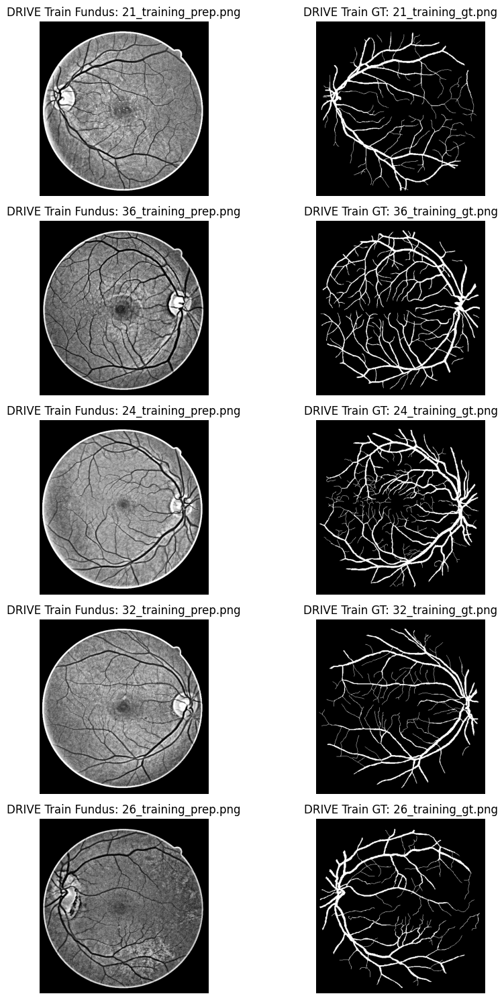

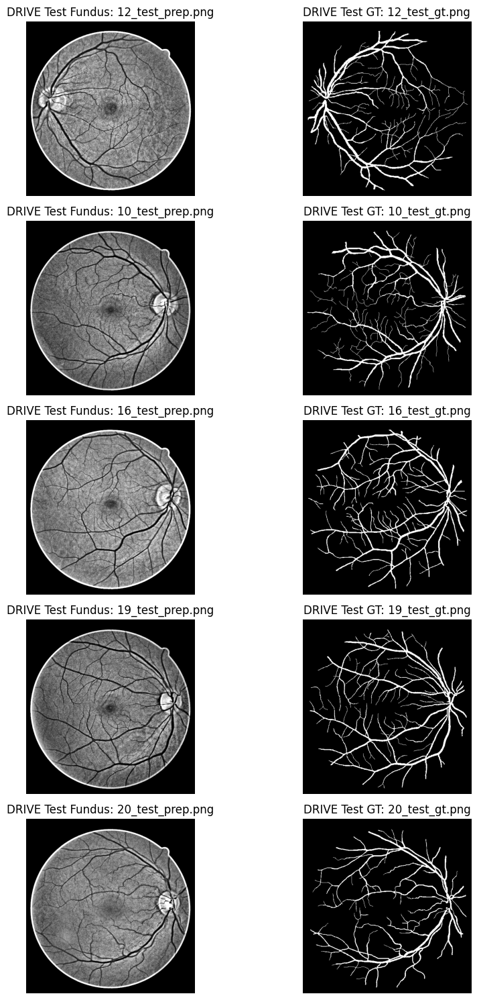

In [ ]:
# Thư mục đã xử lý của DRIVE
drive_pre_dir = f"{base_path}/DRIVE_preprocess"

train_img_dir = os.path.join(drive_pre_dir, "train/images")
train_lbl_dir = os.path.join(drive_pre_dir, "train/labels")

test_img_dir  = os.path.join(drive_pre_dir, "test/images")
test_lbl_dir  = os.path.join(drive_pre_dir, "test/labels")

# Hiển thị ngẫu nhiên 5 ảnh từ train và test
visualize_random_samples(train_img_dir, train_lbl_dir, n=5, title_prefix="DRIVE Train")
visualize_random_samples(test_img_dir, test_lbl_dir, n=5, title_prefix="DRIVE Test")

#### Vessel Ratio - DRIVE GT

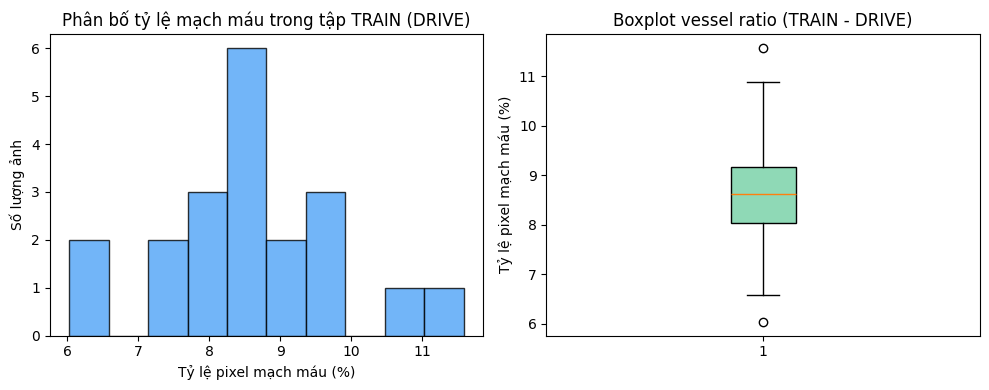

In [ ]:
label_dir = train_lbl_dir
ratios = []
for fname in os.listdir(label_dir):
    if not fname.lower().endswith(('.png', '.jpg', '.tif', '.gif')):
        continue
    mask = cv2.imread(os.path.join(label_dir, fname), cv2.IMREAD_GRAYSCALE)
    if mask is None:
        continue
    vessel_ratio = np.count_nonzero(mask > 0) / mask.size
    ratios.append(vessel_ratio)

ratios = np.array(ratios)
mean_ratio = np.mean(ratios) * 100

# Plot histogram và boxplot
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.hist(ratios*100, bins=10, color="#4fa3f7", edgecolor="black", alpha=0.8)
plt.xlabel("Tỷ lệ pixel mạch máu (%)")
plt.ylabel("Số lượng ảnh")
plt.title("Phân bố tỷ lệ mạch máu trong tập TRAIN (DRIVE)")

plt.subplot(1,2,2)
plt.boxplot(ratios*100, patch_artist=True, boxprops=dict(facecolor="#8fd9b6"))
plt.ylabel("Tỷ lệ pixel mạch máu (%)")
plt.title("Boxplot vessel ratio (TRAIN - DRIVE)")

plt.tight_layout()
plt.show()

In [ ]:
ratios = []
for fname in os.listdir(label_dir):
    if not fname.lower().endswith(('.png', '.jpg', '.tif', '.gif')):
        continue
    mask = cv2.imread(os.path.join(label_dir, fname), cv2.IMREAD_GRAYSCALE)
    if mask is None:
        continue
    # Pixel > 0 là mạch máu
    vessel_ratio = np.count_nonzero(mask > 0) / mask.size
    ratios.append(vessel_ratio)

mean_ratio = np.mean(ratios)
print(f"Trung bình trên tập TRAIN (DRIVE): {mean_ratio*100:.2f}% pixel là mạch máu")

Trung bình trên tập TRAIN (DRIVE): 8.63% pixel là mạch máu


#### Apply for STARE (pipeline)

In [10]:
def preprocess_stare_with_gt(img_dir, gt_dir, save_dir, subset_list):
    """
    Tiền xử lý cho STARE:
    - Ảnh fundus RGB (.png)
    - Ground truth từ expert 1 (pnglabel_vk)
    - Pipeline: Grayscale (focus G) → CLAHE → MTHT → Normalize [0,1]
    """
    img_out = os.path.join(save_dir, "images")
    gt_out  = os.path.join(save_dir, "labels")
    os.makedirs(img_out, exist_ok=True)
    os.makedirs(gt_out, exist_ok=True)

    for f in tqdm(subset_list, desc=f"Processing STARE {os.path.basename(save_dir)}"):
        name = os.path.splitext(f)[0]

        img_path = os.path.join(img_dir, f)
        gt_path  = os.path.join(gt_dir, f)

        if not os.path.exists(img_path):
            print(f"Không tìm thấy ảnh: {img_path}")
            continue
        if not os.path.exists(gt_path):
            print(f"Không tìm thấy nhãn: {gt_path}")
            continue

        # Load ảnh fundus và GT
        rgb = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        gt  = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
        gt  = (gt > 0).astype(np.uint8)   # chuyển thành mask nhị phân

        # PIPELINE TIỀN XỬ LÝ
        gray = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
        mtht_img  = multiscale_tophat_entropy(gray)
        clahe_img = apply_CLAHE(mtht_img)
        norm_img  = zscore_normalize(clahe_img)

        # Lưu kết quả
        cv2.imwrite(f"{img_out}/{name}_prep.png", (norm_img * 255).astype(np.uint8))
        cv2.imwrite(f"{gt_out}/{name}_gt.png", (gt * 255).astype(np.uint8))

In [ ]:
base_path = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel"

stare_img_dir = f"{base_path}/STARE/pngdata"
stare_gt_dir  = f"{base_path}/STARE/pnglabel_vk"   # expert 1
stare_pre_dir = f"{base_path}/STARE_preprocess"

# Danh sách ảnh gốc
stare_imgs = sorted([f for f in os.listdir(stare_img_dir) if f.endswith('.png')])

# Lọc danh sách nhãn
valid_gt = sorted([
    f for f in os.listdir(stare_gt_dir)
    if f.endswith('.png') and "_1stHO" not in f and "_2ndHO" not in f
])

valid_imgs = [f for f in stare_imgs if f in valid_gt]

# Chia 70% train, 30% test
n_train = int(0.7 * len(valid_imgs))
train_imgs = valid_imgs[:n_train]
test_imgs  = valid_imgs[n_train:]

os.makedirs(f"{stare_pre_dir}/train", exist_ok=True)
os.makedirs(f"{stare_pre_dir}/test", exist_ok=True)

preprocess_stare_with_gt(stare_img_dir, stare_gt_dir, f"{stare_pre_dir}/train", train_imgs)
preprocess_stare_with_gt(stare_img_dir, stare_gt_dir, f"{stare_pre_dir}/test", test_imgs)

Processing STARE test: 100%|██████████| 6/6 [00:13<00:00,  2.17s/it]


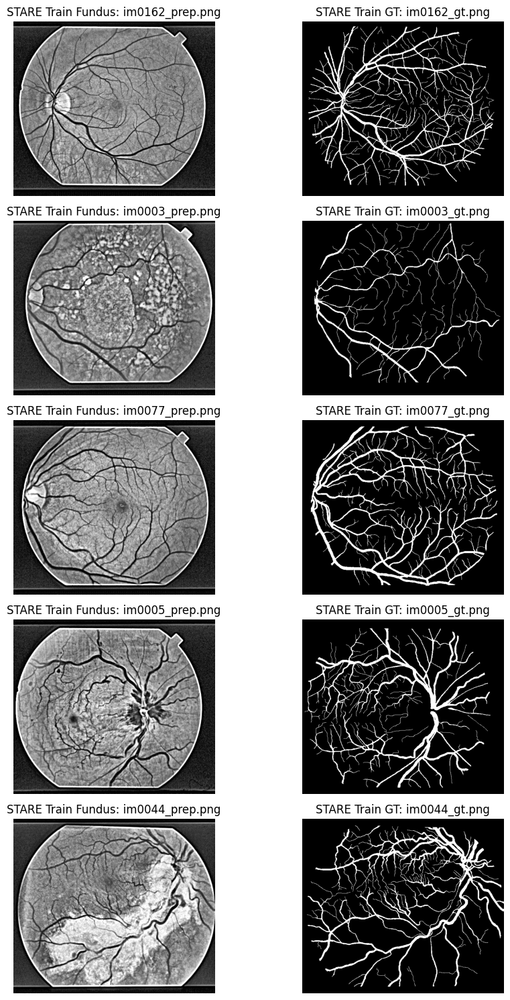

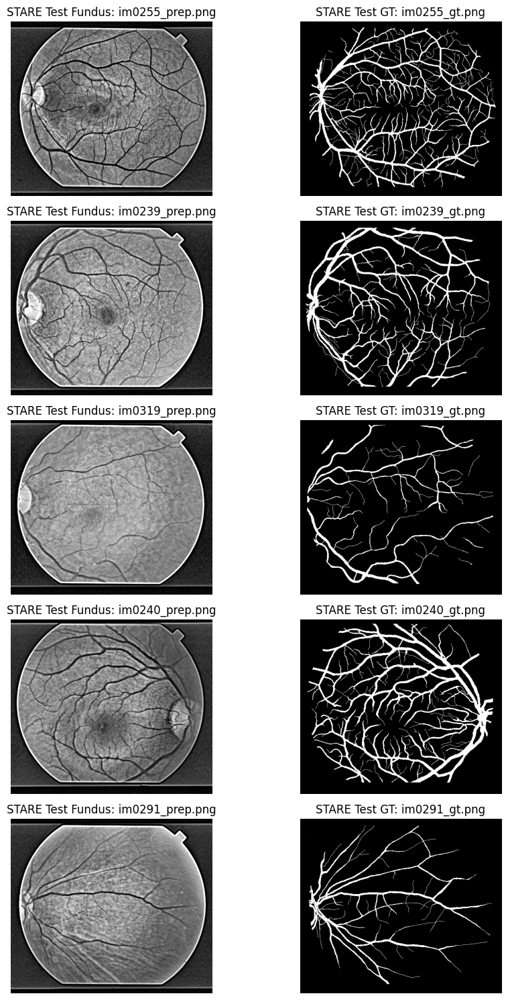

In [ ]:
# Thư mục đã xử lý của STARE
stare_pre_dir = f"{base_path}/STARE_preprocess"

train_img_dir = os.path.join(stare_pre_dir, "train/images")
train_lbl_dir = os.path.join(stare_pre_dir, "train/labels")

test_img_dir  = os.path.join(stare_pre_dir, "test/images")
test_lbl_dir  = os.path.join(stare_pre_dir, "test/labels")

# Hiển thị ngẫu nhiên 5 ảnh từ train và test
visualize_random_samples(train_img_dir, train_lbl_dir, n=5, title_prefix="STARE Train")
visualize_random_samples(test_img_dir, test_lbl_dir, n=5, title_prefix="STARE Test")

#### Vessel Ratio - STARE GT


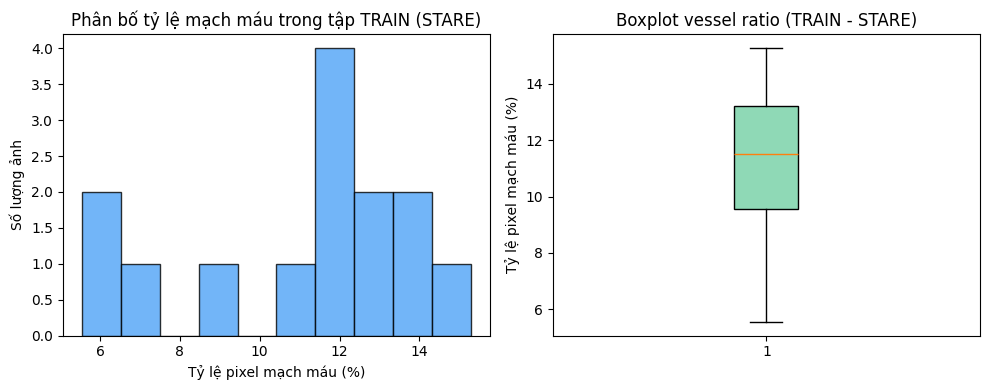

In [ ]:
label_dir = train_lbl_dir
ratios = []
for fname in os.listdir(label_dir):
    if not fname.lower().endswith(('.png', '.jpg', '.tif', '.gif')):
        continue
    mask = cv2.imread(os.path.join(label_dir, fname), cv2.IMREAD_GRAYSCALE)
    if mask is None:
        continue
    vessel_ratio = np.count_nonzero(mask > 0) / mask.size
    ratios.append(vessel_ratio)

ratios = np.array(ratios)
mean_ratio = np.mean(ratios) * 100

# Plot histogram và boxplot
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.hist(ratios*100, bins=10, color="#4fa3f7", edgecolor="black", alpha=0.8)
plt.xlabel("Tỷ lệ pixel mạch máu (%)")
plt.ylabel("Số lượng ảnh")
plt.title("Phân bố tỷ lệ mạch máu trong tập TRAIN (STARE)")

plt.subplot(1,2,2)
plt.boxplot(ratios*100, patch_artist=True, boxprops=dict(facecolor="#8fd9b6"))
plt.ylabel("Tỷ lệ pixel mạch máu (%)")
plt.title("Boxplot vessel ratio (TRAIN - STARE)")

plt.tight_layout()
plt.show()

In [ ]:
ratios = []
for fname in os.listdir(label_dir):
    if not fname.lower().endswith(('.png', '.jpg', '.tif', '.gif')):
        continue
    mask = cv2.imread(os.path.join(label_dir, fname), cv2.IMREAD_GRAYSCALE)
    if mask is None:
        continue
    # Pixel > 0 là mạch máu
    vessel_ratio = np.count_nonzero(mask > 0) / mask.size
    ratios.append(vessel_ratio)

mean_ratio = np.mean(ratios)
print(f"Trung bình trên tập TRAIN (STARE): {mean_ratio*100:.2f}% pixel là mạch máu")

Trung bình trên tập TRAIN (STARE): 11.03% pixel là mạch máu


tăng cường dữ liệu bằng cách:
- rotation: xoay quanh tâm ảnh trong khoảng -45, +45 - random
- translation: dịch ngẫu nhiên theo công thức: t_x​<w\*0.448, t_y​<h\*0.448
- mirroring (fliiping): phản chiếu ảnh theo các hướng (ngang, dọc, xoay 90 và -90)
- số lượng ảnh tăng thêm: sau mỗi ảnh gốc, sinh ra ~ 8 biến thể

- brightness jitter, contrast jitter, gamma random, blur/noise

#### Chia train-val-test

In [ ]:
# import os
# import shutil
# from glob import glob

# BASE_PATH = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel"

# def make_dir(path):
#     os.makedirs(path, exist_ok=True)

# def split_dataset(base_folder, val_ratio=0.2):
#     """
#     Chia train → train + val, KHÔNG random, chia tuần tự (ảnh đầu cho train, ảnh cuối cho val)
#     """
#     train_img_dir = os.path.join(base_folder, "train/images")
#     train_lbl_dir = os.path.join(base_folder, "train/labels")

#     all_images = sorted(glob(os.path.join(train_img_dir, "*.*")))
#     all_labels = sorted(glob(os.path.join(train_lbl_dir, "*.*")))

#     assert len(all_images) == len(all_labels), f"Số ảnh và nhãn không khớp ở {base_folder}"

#     total = len(all_images)
#     split_idx = int(total * (1 - val_ratio))

#     train_idx = list(range(split_idx))
#     val_idx = list(range(split_idx, total))

#     val_img_dir = os.path.join(base_folder, "val/images")
#     val_lbl_dir = os.path.join(base_folder, "val/labels")

#     # Tạo mới thư mục val/
#     for d in [val_img_dir, val_lbl_dir]:
#         make_dir(d)

#     print(f"{base_folder}")
#     print(f"  ├── Tổng ảnh train ban đầu: {total}")
#     print(f"  ├── Giữ lại train: {len(train_idx)} ảnh")
#     print(f"  ├── Chuyển sang val: {len(val_idx)} ảnh")

#     # Di chuyển ảnh cuối cùng sang val/
#     for i in val_idx:
#         img_name = os.path.basename(all_images[i])
#         lbl_name = os.path.basename(all_labels[i])

#         shutil.move(all_images[i], os.path.join(val_img_dir, img_name))
#         shutil.move(all_labels[i], os.path.join(val_lbl_dir, lbl_name))

# # Áp dụng cho DRIVE và STARE
# for ds in ["DRIVE_preprocess", "STARE_preprocess"]:
#     split_dataset(os.path.join(BASE_PATH, ds), val_ratio=0.2)

/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/DRIVE_preprocess
  ├── Tổng ảnh train ban đầu: 20
  ├── Giữ lại train: 16 ảnh
  ├── Chuyển sang val: 4 ảnh
/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/STARE_preprocess
  ├── Tổng ảnh train ban đầu: 14
  ├── Giữ lại train: 11 ảnh
  ├── Chuyển sang val: 3 ảnh


### Merge dataset

In [ ]:
# import os
# import shutil
# from glob import glob

# BASE_PATH = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel"
# CROSS = f"{BASE_PATH}/CROSS_preprocess"

# def make_dir(path):
#     os.makedirs(path, exist_ok=True)

# def copy_pair(src_dir, dst_dir):
#     img_src = sorted(glob(f"{src_dir}/images/*.png"))
#     lbl_src = sorted(glob(f"{src_dir}/labels/*.png"))

#     assert len(img_src) == len(lbl_src), f"Lỗi: số ảnh != nhãn tại {src_dir}"

#     for img_path, lbl_path in zip(img_src, lbl_src):
#         shutil.copy(img_path, f"{dst_dir}/images/")
#         shutil.copy(lbl_path, f"{dst_dir}/labels/")


# # --------------------------------------
# # 1. RESET CROSS_preprocess
# # --------------------------------------
# shutil.rmtree(CROSS, ignore_errors=True)

# for sub in [
#     "train/images", "train/labels",
#     "val/images", "val/labels",
#     "test/images", "test/labels"
# ]:
#     make_dir(f"{CROSS}/{sub}")


# # --------------------------------------
# # 2. MERGE TRAIN / VAL / TEST
# # --------------------------------------
# for subset in ["train", "val", "test"]:
#     print(f"\n=== MERGE {subset.upper()} ===")
#     for ds in ["DRIVE_preprocess", "STARE_preprocess"]:
#         src = f"{BASE_PATH}/{ds}/{subset}"
#         dst = f"{CROSS}/{subset}"
#         copy_pair(src, dst)

# print("\n🎉 Merge CROSS_preprocess HOÀN TẤT!")


=== MERGE TRAIN ===

=== MERGE VAL ===

=== MERGE TEST ===

🎉 Merge CROSS_preprocess HOÀN TẤT!


### U-Net model

In [11]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

Using device: cuda


In [12]:
class _DoubleConvolution(nn.Module):
    def __init__(self, in_channels, middle_channel, out_channels, p=0):
        super(_DoubleConvolution, self).__init__()
        layers = [
            nn.Conv2d(in_channels, middle_channel, kernel_size=3, padding=p),
            nn.BatchNorm2d(middle_channel),
            nn.ReLU(inplace=True),
            nn.Conv2d(middle_channel, out_channels, kernel_size=3, padding=p),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        ]
        self.encode = nn.Sequential(*layers)

    def forward(self, x):
        return self.encode(x)


class UNet(nn.Module):
    def __init__(self, num_channels, num_classes):
        super(UNet, self).__init__()

        reduce_by = 1

        self.A1_ = _DoubleConvolution(num_channels, int(64 / reduce_by), int(64 / reduce_by))
        self.A2_ = _DoubleConvolution(int(64 / reduce_by), int(128 / reduce_by), int(128 / reduce_by))
        self.A3_ = _DoubleConvolution(int(128 / reduce_by), int(256 / reduce_by), int(256 / reduce_by))
        self.A4_ = _DoubleConvolution(int(256 / reduce_by), int(512 / reduce_by), int(512 / reduce_by))

        self.A_mid = _DoubleConvolution(int(512 / reduce_by), int(1024 / reduce_by), int(1024 / reduce_by))

        self.A4_up = nn.ConvTranspose2d(int(1024 / reduce_by), int(512 / reduce_by), kernel_size=2, stride=2)
        self._A4 = _DoubleConvolution(int(1024 / reduce_by), int(512 / reduce_by), int(512 / reduce_by))

        self.A3_up = nn.ConvTranspose2d(int(512 / reduce_by), int(256 / reduce_by), kernel_size=2, stride=2)
        self._A3 = _DoubleConvolution(int(512 / reduce_by), int(256 / reduce_by), int(256 / reduce_by))

        self.A2_up = nn.ConvTranspose2d(int(256 / reduce_by), int(128 / reduce_by), kernel_size=2, stride=2)
        self._A2 = _DoubleConvolution(int(256 / reduce_by), int(128 / reduce_by), int(128 / reduce_by))

        self.A1_up = nn.ConvTranspose2d(int(128 / reduce_by), int(64 / reduce_by), kernel_size=2, stride=2)
        self._A1 = _DoubleConvolution(int(128 / reduce_by), int(64 / reduce_by), int(64 / reduce_by))

        self.final = nn.Conv2d(int(64 / reduce_by), num_classes, kernel_size=1)
        initialize_weights(self)

    def forward(self, x):
        a1_ = self.A1_(x)
        a1_dwn = F.max_pool2d(a1_, kernel_size=2, stride=2)

        a2_ = self.A2_(a1_dwn)
        a2_dwn = F.max_pool2d(a2_, kernel_size=2, stride=2)

        a3_ = self.A3_(a2_dwn)
        a3_dwn = F.max_pool2d(a3_, kernel_size=2, stride=2)

        a4_ = self.A4_(a3_dwn)
        # a4_ = F.dropout(a4_, p=0.2)
        a4_dwn = F.max_pool2d(a4_, kernel_size=2, stride=2)

        a_mid = self.A_mid(a4_dwn)

        a4_up = self.A4_up(a_mid)
        _a4 = self._A4(UNet.match_and_concat(a4_, a4_up))
        # _a4 = F.dropout(_a4, p=0.2)

        a3_up = self.A3_up(_a4)
        _a3 = self._A3(UNet.match_and_concat(a3_, a3_up))

        a2_up = self.A2_up(_a3)
        _a2 = self._A2(UNet.match_and_concat(a2_, a2_up))
        # _a2 = F.dropout(_a2, p=0.2)

        a1_up = self.A1_up(_a2)
        _a1 = self._A1(UNet.match_and_concat(a1_, a1_up))

        final = self.final(_a1)
        return final

    @staticmethod
    def match_and_concat(bypass, upsampled, crop=True):
        if crop:
            c = (bypass.size()[2] - upsampled.size()[2]) // 2
            bypass = F.pad(bypass, (-c, -c, -c, -c))
        return torch.cat((upsampled, bypass), 1)


m = UNet(1, 2)
torch_total_params = sum(p.numel() for p in m.parameters() if p.requires_grad)
print('Total Params:', torch_total_params) # 31042434

Total Params: 31042434


### Data Loader

In [13]:
def _center_crop(arr, target_h, target_w):
    h, w = arr.shape[:2]
    y0 = (h - target_h) // 2
    x0 = (w - target_w) // 2
    return arr[y0:y0+target_h, x0:x0+target_w]

class PatchDataset(Dataset):
    """
    Patch-based dataset cho UNet(valid): input 572x572, label 388x388.
    - patch_size: 388 (khu vực supervise)
    - expand_by: 184 => expanded = 572 cho input/label trước augment
    - variants_per_patch: số biến thể augment mỗi patch gốc (vd: 8)
    """
    def __init__(self, img_dir, label_dir, patch_size=388, expand_by=184,
                 patch_offset=150, mode='train', augment_prob=0.8, variants_per_patch=8):
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.patch_size = patch_size
        self.expand_by = expand_by
        self.expanded = patch_size + expand_by  # 572
        self.patch_offset = patch_offset
        self.mode = mode
        self.augment_prob = augment_prob
        self.variants_per_patch = variants_per_patch if mode == 'train' else 1

        self.img_files = sorted([f for f in os.listdir(img_dir) if f.lower().endswith('.png')])
        self.base_patches = self._extract_patch_info()  # danh sách patch gốc
        # lập index map để nhân mẫu ~8 biến thể / patch
        self.index_map = [(i, k) for i in range(len(self.base_patches)) for k in range(self.variants_per_patch)]

        print(f"Base patches: {len(self.base_patches)} | Variants per patch: {self.variants_per_patch} "
              f"| Effective samples: {len(self.index_map)}")

    def _extract_patch_info(self):
        patches = []
        for img_idx, img_file in enumerate(self.img_files):
            img_path = os.path.join(self.img_dir, img_file)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                continue
            h, w = img.shape
            for y in range(0, max(1, h - self.patch_size + 1), self.patch_offset):
                for x in range(0, max(1, w - self.patch_size + 1), self.patch_offset):
                    y = min(y, h - self.patch_size)
                    x = min(x, w - self.patch_size)
                    patches.append({'img_idx': img_idx, 'img_file': img_file, 'y': y, 'x': x})
        return patches

    def _get_expanded_patch(self, img, y, x):
        # từ patch 388 lấy expanded 572 (pad reflect nếu cần)
        h, w = img.shape
        half = self.expand_by // 2
        y0, y1 = y - half, y + self.patch_size + half
        x0, x1 = x - half, x + self.patch_size + half

        pad_top   = max(0, -y0)
        pad_left  = max(0, -x0)
        pad_bot   = max(0,  y1 - h)
        pad_right = max(0,  x1 - w)

        y0 = max(0, y0); x0 = max(0, x0)
        y1 = min(h, y1); x1 = min(w, x1)
        patch = img[y0:y1, x0:x1]

        if pad_top or pad_bot or pad_left or pad_right:
            patch = np.pad(patch, ((pad_top, pad_bot), (pad_left, pad_right)), mode='reflect')
        return patch  # (572, 572)

    #  augment utils function
    def _random_mirror_90(self, img, lab):
        choice = random.choice(['none','flip_h','flip_v','rot90','rot270'])
        return self._apply_mirror_choice(img, lab, choice)

    def _apply_mirror_choice(self, img, lab, choice):
        if choice == 'flip_h':
            return np.flip(img, 1).copy(), np.flip(lab, 1).copy()
        if choice == 'flip_v':
            return np.flip(img, 0).copy(), np.flip(lab, 0).copy()
        if choice == 'rot90':
            return np.rot90(img, 1).copy(), np.rot90(lab, 1).copy()
        if choice == 'rot270':
            return np.rot90(img, 3).copy(), np.rot90(lab, 3).copy()
        return img, lab

    def _brightness_contrast(self, img):
        # img float[0,1] → jitter alpha,beta
        alpha = random.uniform(0.8, 1.2)  # contrast
        beta  = random.uniform(-0.12, 0.12)  # brightness approx in [0,1] scale
        out = img * alpha + beta
        return np.clip(out, 0.0, 1.0)

    def _gamma(self, img):
        g = random.uniform(0.7, 1.3)
        # avoid 0^gamma issues
        return np.power(np.clip(img, 1e-6, 1.0), g)

    def _blur_or_noise(self, img):
        if random.random() < 0.5:
            # Gaussian blur
            k = random.choice([3,5])
            return cv2.GaussianBlur(img, (k,k), 0)
        else:
            # Gaussian noise
            sigma = random.uniform(0.005, 0.02)
            noise = np.random.normal(0.0, sigma, img.shape).astype(np.float32)
            return np.clip(img + noise, 0.0, 1.0)

    def _apply_appearance_aug(self, img):
        # áp dụng một tập nhỏ các aug ảnh xám
        if random.random() < 0.6:
            img = self._brightness_contrast(img)
        if random.random() < 0.6:
            img = self._gamma(img)
        if random.random() < 0.5:
            img = self._blur_or_noise(img)
        return img

    def __len__(self):
        return len(self.index_map)

    def __getitem__(self, idx):
        base_idx, _ = self.index_map[idx]
        info = self.base_patches[base_idx]
        img_file, y, x = info['img_file'], info['y'], info['x']

        # nạp ảnh & nhãn gốc
        img_path = os.path.join(self.img_dir, img_file)
        label_file = img_file.replace('_prep', '_gt')
        lab_path = os.path.join(self.label_dir, label_file)

        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        lab = cv2.imread(lab_path, cv2.IMREAD_GRAYSCALE)
        if img is None or lab is None:
            raise FileNotFoundError(img_path if img is None else lab_path)

        # lấy patch expanded 572x572 cho cả ảnh và nhãn
        img_exp = self._get_expanded_patch(img, y, x).astype(np.float32) / 255.0
        lab_exp = self._get_expanded_patch(lab, y, x) # (572,572)
        lab_exp = (lab_exp > 0).astype(np.uint8)

        # crop
        # img_crop = _center_crop(img_exp, self.patch_size, self.patch_size)
        # lab_crop = _center_crop(lab_exp, self.patch_size, self.patch_size).astype(np.int64)
        lab_center = _center_crop(lab_exp, self.patch_size, self.patch_size).astype(np.int64)

        # augment
        if self.mode == 'train' and random.random() < self.augment_prob:
            # img_crop, lab_crop = self._random_mirror_90(img_crop, lab_crop)
            img_exp, lab_center = self._random_mirror_90(img_exp, lab_center)
            img_exp = self._apply_appearance_aug(img_exp)

            # img_crop = self._apply_appearance_aug(img_crop)

        # chuyển sang cấu ctruc dữ liệu tensor
        # img_t = torch.from_numpy(img_crop).unsqueeze(0).float()
        img_t = torch.from_numpy(img_exp).unsqueeze(0).float()   # [1,572,572]
        # lab_t = torch.from_numpy(lab_crop).long()                 # [388, 388]
        lab_t = torch.from_numpy(lab_center).long()             # [388,388]

        clip_ix = np.array([y, y + self.patch_size, x, x + self.patch_size], dtype=np.int32)
        return img_t, lab_t


##### Call Patch & DataLoader - Cross

In [ ]:
train_dataset = PatchDataset(
    img_dir=f"{BASE_PATH}/CROSS_preprocess/train/images",
    label_dir=f"{BASE_PATH}/CROSS_preprocess/train/labels",
    mode='train',
    augment_prob=0.8,
    variants_per_patch=4
)

val_dataset = PatchDataset(
    img_dir=f"{BASE_PATH}/CROSS_preprocess/val/images",
    label_dir=f"{BASE_PATH}/CROSS_preprocess/val/labels",
    mode='val',
    augment_prob=0.0,
    variants_per_patch=1
)

test_dataset = PatchDataset(
    img_dir=f"{BASE_PATH}/CROSS_preprocess/test/images",
    label_dir=f"{BASE_PATH}/CROSS_preprocess/test/labels",
    mode='test',
    augment_prob=0.0,
    variants_per_patch=1
)

Base patches: 130 | Variants per patch: 4 | Effective samples: 520
Base patches: 34 | Variants per patch: 1 | Effective samples: 34
Base patches: 116 | Variants per patch: 1 | Effective samples: 116


In [ ]:
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=2, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=2, shuffle=False, num_workers=2, pin_memory=True)

##### Plot test DataLoader - Cross

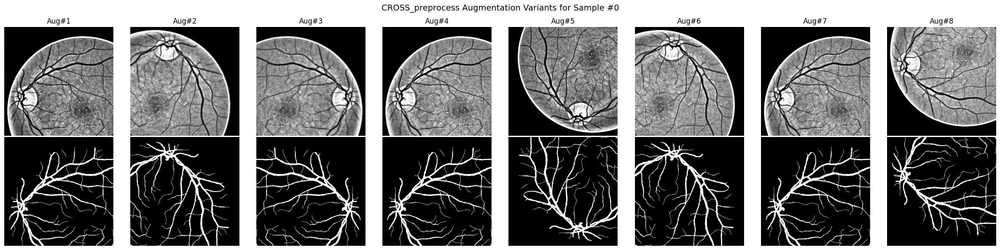

In [ ]:
import matplotlib.pyplot as plt

def center_crop(arr, target_h, target_w):
    """Crop ảnh/mask về kích thước trung tâm [target_h, target_w]."""
    h, w = arr.shape[-2:]
    y0 = (h - target_h) // 2
    x0 = (w - target_w) // 2
    return arr[..., y0:y0+target_h, x0:x0+target_w]

# patch gốc
sample_idx = 0
n_variants = 8

fig, axes = plt.subplots(2, n_variants, figsize=(3*n_variants, 6))

for k in range(n_variants):
    img_t, lab_t = train_dataset[sample_idx]   # đổi thành train_dataset (CROSS)

    img_np = img_t.squeeze(0).numpy()          # [572,572]
    lab_np = lab_t.numpy()                     # [388,388]

    # crop ảnh 572 → 388 để khớp với mask
    img_crop = center_crop(img_np, lab_np.shape[0], lab_np.shape[1])

    # scale lại cho hiển thị đẹp
    img_disp = (img_crop - img_crop.min()) / (img_crop.max() - img_crop.min() + 1e-8)

    axes[0, k].imshow(img_disp, cmap='gray')
    axes[0, k].set_title(f"Aug#{k+1}")
    axes[0, k].axis('off')

    axes[1, k].imshow(lab_np, cmap='gray')
    axes[1, k].axis('off')

plt.suptitle(f"CROSS_preprocess Augmentation Variants for Sample #{sample_idx}", fontsize=14)
plt.tight_layout()
plt.show()

### Training & Evaluation

In [14]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 45.3 MB/s eta 0:00:00


In [ ]:
model = UNet(num_channels=1, num_classes=1).to(device)

In [15]:
from torchmetrics.classification import BinaryPrecision, BinaryRecall, BinaryF1Score, BinaryAccuracy

# khởi tạo metric module (1 lần, tái dùng trong train + val)
def init_metrics(device):
    metrics = {
        "precision": BinaryPrecision(threshold=0.5).to(device),
        "recall":    BinaryRecall(threshold=0.5).to(device),
        "f1":        BinaryF1Score(threshold=0.5).to(device),
        "accuracy":  BinaryAccuracy(threshold=0.5).to(device)
    }
    return metrics

# hàm train 1 epoch
def train_epoch(model, train_loader, criterion, optimizer, device, metrics, scaler):
    model.train()
    total_loss = total_precision = total_recall = total_f1 = total_acc = 0
    num_batches = 0

    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        target = target.unsqueeze(1).float()

        optimizer.zero_grad()
        with autocast():
            output = model(data)
            loss = criterion(output, target)

        scaler.scale(loss).backward()                    # scaled backward
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()

        preds = torch.sigmoid(output)
        total_precision += metrics["precision"](preds, target).item()
        total_recall    += metrics["recall"](preds, target).item()
        total_f1        += metrics["f1"](preds, target).item()
        total_acc       += metrics["accuracy"](preds, target).item()
        total_loss      += loss.item()
        num_batches     += 1

        if batch_idx % 10 == 0:
            print(f"Batch {batch_idx}/{len(train_loader)} | "
                  f"Loss: {loss.item():.4f} | F1: {metrics['f1'](preds, target).item():.4f}")

    return (
        total_loss/num_batches,
        total_precision/num_batches,
        total_recall/num_batches,
        total_f1/num_batches,
        total_acc/num_batches
    )

def validate_epoch(model, val_loader, criterion, device, metrics):
    model.eval()
    total_loss = total_precision = total_recall = total_f1 = total_acc = 0
    num_batches = 0

    with torch.no_grad():
        for data, target in val_loader:
            data, target = data.to(device), target.to(device)
            target = target.unsqueeze(1).float()  # thêm chiều channel

            output = model(data)
            loss = criterion(output, target)
            preds = torch.sigmoid(output)

            total_precision += metrics["precision"](preds, target).item()
            total_recall    += metrics["recall"](preds, target).item()
            total_f1        += metrics["f1"](preds, target).item()
            total_acc       += metrics["accuracy"](preds, target).item()
            total_loss      += loss.item()
            num_batches     += 1

    return (
        total_loss/num_batches,
        total_precision/num_batches,
        total_recall/num_batches,
        total_f1/num_batches,
        total_acc/num_batches
    )


# setup training components
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
metrics = init_metrics(device)

# loss = BCE + Dice
def dice_loss(pred, target, smooth=1e-6):
    pred = torch.sigmoid(pred)
    pred = pred.contiguous().view(-1)
    target = target.contiguous().view(-1)
    intersection = (pred * target).sum()
    return 1 - ((2. * intersection + smooth) /
                (pred.sum() + target.sum() + smooth))

def combined_loss(pred, target):
    bce = nn.BCEWithLogitsLoss()(pred, target)
    return bce + dice_loss(pred, target)

#### Start Training and get Res U-Net from Cross

In [ ]:
import copy

def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, metrics, device, num_epochs, save_path, scaler):
    best_f1 = 0
    patience = 10
    trigger = 0
    history = {"train_loss": [], "val_loss": [], "train_f1": [], "val_f1": [], "train_acc": [], "val_acc": []}

    for epoch in range(num_epochs):
        print(f"\n===== Epoch {epoch+1}/{num_epochs} =====")

        train_loss, train_prec, train_rec, train_f1, train_acc = train_epoch(model, train_loader, criterion, optimizer, device, metrics, scaler)
        val_loss, val_prec, val_rec, val_f1, val_acc = validate_epoch(model, val_loader, criterion, device, metrics)

        scheduler.step(val_loss)
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_f1"].append(train_f1)
        history["val_f1"].append(val_f1)
        history["train_acc"].append(train_acc)
        history["val_acc"].append(val_acc)

        print(f"Train: Loss={train_loss:.4f}, F1={train_f1:.4f}, Acc={train_acc:.4f}")
        print(f"Val:   Loss={val_loss:.4f}, F1={val_f1:.4f}, Acc={val_acc:.4f}")

        # Early stopping
        if val_f1 > best_f1:
            best_f1 = val_f1
            best_wts = copy.deepcopy(model.state_dict())
            torch.save(model.state_dict(), save_path)
            print(f"Saved best model (F1={val_f1:.4f})")
            trigger = 0
        else:
            trigger += 1
            if trigger >= patience:
                print("Early stopping triggered!")
                break

    model.load_state_dict(best_wts)
    print(f"\nTraining done! Best F1 = {best_f1:.4f}")

    # plot learning curve
    plt.figure(figsize=(14,5))
    plt.subplot(1,2,1)
    plt.plot(history["train_loss"], label='Train Loss')
    plt.plot(history["val_loss"], label='Val Loss')
    plt.title("Loss Curve")
    plt.legend(); plt.grid(True)
    plt.subplot(1,2,2)
    plt.plot(history["train_f1"], label='Train F1')
    plt.plot(history["val_f1"], label='Val F1')
    plt.title("F1 Curve")
    plt.legend(); plt.grid(True)
    plt.show()

    return model, history

/tmp/ipython-input-3995244281.py:6: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Training on CROSS_preprocess...

===== Epoch 1/80 =====


/tmp/ipython-input-147711129.py:26: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():                                 # 💡 FP16 precision block


Batch 0/260 | Loss: 1.4844 | F1: 0.1497
Batch 10/260 | Loss: 1.4240 | F1: 0.2155
Batch 20/260 | Loss: 1.3947 | F1: 0.2557
Batch 30/260 | Loss: 1.2659 | F1: 0.4080
Batch 40/260 | Loss: 1.2104 | F1: 0.4791
Batch 50/260 | Loss: 1.2320 | F1: 0.4519
Batch 60/260 | Loss: 1.2929 | F1: 0.3918
Batch 70/260 | Loss: 1.2504 | F1: 0.4003
Batch 80/260 | Loss: 1.0618 | F1: 0.5935
Batch 90/260 | Loss: 1.2483 | F1: 0.3842
Batch 100/260 | Loss: 1.1262 | F1: 0.5318
Batch 110/260 | Loss: 1.1301 | F1: 0.4824
Batch 120/260 | Loss: 0.9511 | F1: 0.6652
Batch 130/260 | Loss: 0.9709 | F1: 0.6497
Batch 140/260 | Loss: 1.1049 | F1: 0.5265
Batch 150/260 | Loss: 1.0376 | F1: 0.6039
Batch 160/260 | Loss: 1.0227 | F1: 0.6209
Batch 170/260 | Loss: 1.0513 | F1: 0.5912
Batch 180/260 | Loss: 0.9055 | F1: 0.6754
Batch 190/260 | Loss: 0.9075 | F1: 0.6872
Batch 200/260 | Loss: 1.0249 | F1: 0.5812
Batch 210/260 | Loss: 0.9727 | F1: 0.6102
Batch 220/260 | Loss: 1.0833 | F1: 0.5405
Batch 230/260 | Loss: 0.9202 | F1: 0.6569
Bat

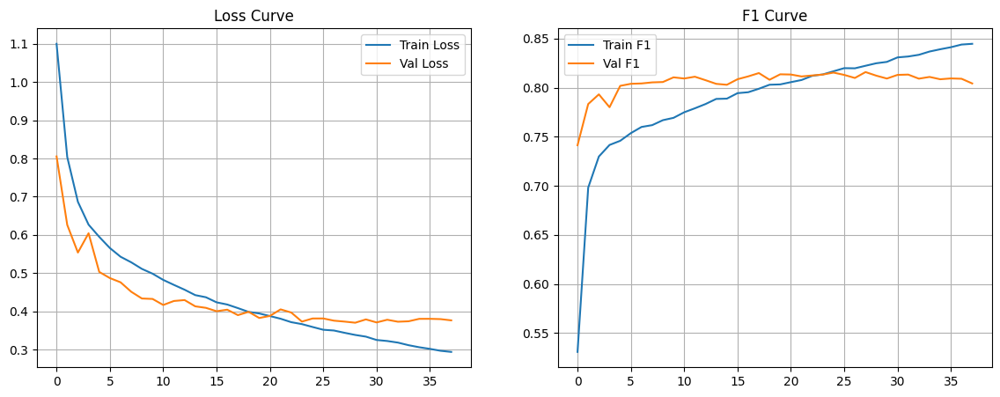

In [ ]:
from torch.cuda.amp import autocast, GradScaler

num_epochs = 80
save_cross = "/content/drive/MyDrive/CV/models/unet_cross_best.pth"

scaler = GradScaler()

print("Training on CROSS_preprocess...")
model_cross = UNet(num_channels=1, num_classes=1).to(device)

optimizer = torch.optim.Adam(
    model_cross.parameters(),
    lr=1e-4,
    weight_decay=1e-5
)

scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=3e-4,
    epochs=num_epochs,
    steps_per_epoch=len(train_loader),
    pct_start=0.3,
    anneal_strategy='cos'
)

model_cross, hist_cross = train_model(
    model_cross,
    train_loader,
    val_loader,
    combined_loss,
    optimizer,
    scheduler,
    metrics,
    device,
    num_epochs,
    save_cross,
    scaler
)

##### Evaluate on Testset

In [16]:
from torchmetrics.classification import (
    BinaryPrecision, BinaryRecall, BinaryF1Score,
    BinaryAccuracy, BinaryJaccardIndex
)

# hàm evaluate model sau khi train
def evaluate_model_torchmetrics(model, loader, device, threshold=0.5):
    model.eval()

    # khởi tạo metric
    precision = BinaryPrecision(threshold=threshold).to(device)
    recall = BinaryRecall(threshold=threshold).to(device)
    f1 = BinaryF1Score(threshold=threshold).to(device)
    acc = BinaryAccuracy(threshold=threshold).to(device)
    iou = BinaryJaccardIndex(threshold=threshold).to(device)

    dice_sum, n_batches = 0, 0

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            target = target.unsqueeze(1).float()

            output = model(data)
            probs = torch.sigmoid(output)
            preds = (probs > threshold).float()

            # cập nhật các metric
            precision.update(preds, target)
            recall.update(preds, target)
            f1.update(preds, target)
            acc.update(preds, target)
            iou.update(preds, target)

            # dice thủ công
            intersection = (preds * target).sum()
            dice = (2 * intersection) / (preds.sum() + target.sum() + 1e-8)
            dice_sum += dice.item()
            n_batches += 1

    # lấy trung bình
    dice_mean = dice_sum / n_batches
    metrics = {
        "Accuracy": acc.compute().item(),
        "Precision": precision.compute().item(),
        "Recall (Sensitivity)": recall.compute().item(),
        "Specificity": None,  # sẽ tính riêng
        "F1-score": f1.compute().item(),
        "Dice": dice_mean,
        "IoU": iou.compute().item()
    }

    # tính Specificity thủ công từ TP,TN,FP,FN
    y_true, y_pred = [], []
    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            target = target.unsqueeze(1).float()
            probs = torch.sigmoid(model(data))
            preds = (probs > threshold).float()

            y_true.append(target.cpu().numpy().ravel())
            y_pred.append(preds.cpu().numpy().ravel())
    y_true = np.concatenate(y_true)
    y_pred = np.concatenate(y_pred)

    tn = np.sum((y_true == 0) & (y_pred == 0))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    specificity = tn / (tn + fp + 1e-8)
    metrics["Specificity"] = specificity

    return metrics

# đánh giá model sau khi train
def test_after_training(model_path, model_class, test_loader, device, dataset_name="DRIVE"):
    print(f"\nEvaluating best model on {dataset_name} test set...")
    model = model_class(num_channels=1, num_classes=1).to(device)
    model.load_state_dict(torch.load(model_path, map_location=device))

    metrics_out = evaluate_model_torchmetrics(model, test_loader, device)

    # chuyển sang DataFrame
    df_results = pd.DataFrame([metrics_out])
    df_results.insert(0, "Dataset", dataset_name)

    print("\nTest Metrics Summary:")
    display(df_results.round(4))

    save_path = f"/content/drive/MyDrive/CV/results/test_metrics_{dataset_name}.csv"
    df_results.to_csv(save_path, index=False)
    print(f"Saved metrics to: {save_path}")

    return df_results

In [ ]:
df_results = test_after_training(
    "/content/drive/MyDrive/CV/models/unet_cross_best.pth",
    UNet,
    test_loader,
    device,
    "CROSS"
)


Evaluating best model on CROSS test set...

Test Metrics Summary:


,Dataset,Accuracy,Precision,Recall (Sensitivity),Specificity,F1-score,Dice,IoU
0,CROSS,0.9537,0.8134,0.7735,0.977,0.793,0.7893,0.6569


Saved metrics to: /content/drive/MyDrive/CV/results/test_metrics_CROSS.csv


##### Generate prob maps

In [ ]:
# thư mục lưu probability maps
save_root = "/content/drive/MyDrive/CV/prob_maps/CROSS"
os.makedirs(save_root, exist_ok=True)

# sinh và lưu bản đồ xác suất cho từng ảnh test
for img_file in tqdm(os.listdir(test_dataset.img_dir), desc="Generating probability maps (patch-based)"):
    if not img_file.lower().endswith(('.png', '.jpg', '.tif')):
        continue

    try:
        # sinh bản đồ xác suất (float32 ∈ [0,1])
        prob_map = generate_probability_map(model_cross, test_dataset, img_file, device)

        # tạo đường dẫn lưu
        base_name = os.path.splitext(img_file)[0]
        save_path = os.path.join(save_root, base_name + "_prob")  # KHÔNG thêm .png ở đây
        ref_path = os.path.join(test_dataset.img_dir, img_file)

        # lưu đồng thời .png (xem trực quan) + .npy (dùng cho GNN)
        save_prob_map(prob_map, save_path, ref_image_path=ref_path, save_npy=True, save_png=True)

    except Exception as e:
        print(f"Lỗi khi xử lý {img_file}: {e}")

print(f"\nProbability maps saved to: {save_root}")

Generating probability maps (patch-based):   4%|▍         | 1/26 [00:00<00:10,  2.48it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/01_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):   8%|▊         | 2/26 [00:00<00:08,  2.75it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/02_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  12%|█▏        | 3/26 [00:01<00:08,  2.85it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/03_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  15%|█▌        | 4/26 [00:01<00:07,  2.82it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/04_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  19%|█▉        | 5/26 [00:01<00:07,  2.88it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/05_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  23%|██▎       | 6/26 [00:02<00:06,  2.90it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/06_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  27%|██▋       | 7/26 [00:02<00:06,  2.90it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/07_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  31%|███       | 8/26 [00:02<00:06,  2.87it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/08_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  35%|███▍      | 9/26 [00:03<00:05,  2.88it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/09_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  38%|███▊      | 10/26 [00:03<00:05,  2.91it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/10_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  42%|████▏     | 11/26 [00:03<00:05,  2.91it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/11_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  46%|████▌     | 12/26 [00:04<00:04,  2.92it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/12_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  50%|█████     | 13/26 [00:04<00:04,  2.88it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/13_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  54%|█████▍    | 14/26 [00:04<00:04,  2.88it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/14_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  58%|█████▊    | 15/26 [00:05<00:03,  2.89it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/15_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  62%|██████▏   | 16/26 [00:05<00:03,  2.88it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/16_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  65%|██████▌   | 17/26 [00:05<00:03,  2.86it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/17_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  69%|██████▉   | 18/26 [00:06<00:02,  2.81it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/18_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  73%|███████▎  | 19/26 [00:06<00:02,  2.82it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/19_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  77%|███████▋  | 20/26 [00:07<00:02,  2.80it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/20_test_prep_prob (.png + .npy)


Generating probability maps (patch-based):  81%|████████  | 21/26 [00:07<00:02,  2.42it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/im0239_prep_prob (.png + .npy)


Generating probability maps (patch-based):  85%|████████▍ | 22/26 [00:08<00:01,  2.20it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/im0240_prep_prob (.png + .npy)


Generating probability maps (patch-based):  88%|████████▊ | 23/26 [00:08<00:01,  2.11it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/im0255_prep_prob (.png + .npy)


Generating probability maps (patch-based):  92%|█████████▏| 24/26 [00:09<00:00,  2.04it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/im0291_prep_prob (.png + .npy)


Generating probability maps (patch-based):  96%|█████████▌| 25/26 [00:09<00:00,  2.01it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/im0319_prep_prob (.png + .npy)


Generating probability maps (patch-based): 100%|██████████| 26/26 [00:10<00:00,  2.51it/s]

Saved prob map: /content/drive/MyDrive/CV/prob_maps/CROSS/im0324_prep_prob (.png + .npy)

Probability maps saved to: /content/drive/MyDrive/CV/prob_maps/CROSS


### Load Model Stage 1

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

SAVE_CROSS_MODEL = "/content/drive/MyDrive/CV/models/unet_cross_best.pth"

model_cross = UNet(num_channels=1, num_classes=1).to(device)

# load trọng số đã train
model_cross.load_state_dict(torch.load(SAVE_CROSS_MODEL, map_location=device))
# chuyển sang eval
model_cross.eval()
print("Loaded Stage-1 U-Net from:", SAVE_CROSS_MODEL)

Loaded Stage-1 U-Net from: /content/drive/MyDrive/CV/models/unet_cross_best.pth


In [17]:
def generate_prob_maps_for_split(model, dataset, img_dir, save_dir, device):
    os.makedirs(save_dir, exist_ok=True)

    for img_file in tqdm(os.listdir(img_dir), desc=f"Generating prob maps → {save_dir}"):
        if not img_file.lower().endswith(('.png','.jpg','.tif')):
            continue

        try:
            prob_map = generate_probability_map(model, dataset, img_file, device)
            base_name = os.path.splitext(img_file)[0].replace("_prep", "")
            save_path = os.path.join(save_dir, base_name + "_prep_prob")
            ref_path = os.path.join(img_dir, img_file)

            save_prob_map(
                prob_map,
                save_path,
                ref_image_path=ref_path,
                save_npy=True,
                save_png=True
            )

        except Exception as e:
            print(f"[ERROR] {img_file}: {e}")
    print(f"[OK] Saved prob maps → {save_dir}")

In [18]:
# OUTPUT PATHS
BASE_PATH = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel"

# RAW
DRIVE_RAW = f"{BASE_PATH}/DRIVE"
STARE_RAW = f"{BASE_PATH}/STARE"

CROSS_PRE = f"{BASE_PATH}/CROSS_preprocess"
PM_TRAIN = "/content/drive/MyDrive/CV/prob_maps/CROSS_train"
PM_VAL   = "/content/drive/MyDrive/CV/prob_maps/CROSS_val"
PM_TEST  = "/content/drive/MyDrive/CV/prob_maps/CROSS_test"
CROSS_IMG_TRAIN = f"{CROSS_PRE}/train/images"
CROSS_LBL_TRAIN = f"{CROSS_PRE}/train/labels"

CROSS_IMG_VAL   = f"{CROSS_PRE}/val/images"
CROSS_LBL_VAL   = f"{CROSS_PRE}/val/labels"

CROSS_IMG_TEST  = f"{CROSS_PRE}/test/images"
CROSS_LBL_TEST  = f"{CROSS_PRE}/test/labels"

In [ ]:
# RUN
generate_prob_maps_for_split(model_cross, train_dataset, CROSS_IMG_TRAIN, PM_TRAIN, device)
generate_prob_maps_for_split(model_cross, val_dataset,   CROSS_IMG_VAL,   PM_VAL,   device)
generate_prob_maps_for_split(model_cross, test_dataset,  CROSS_IMG_TEST,  PM_TEST,  device)

Original: (584, 565), ProbMap (.npy): (584, 565), Prob (.png): (584, 565)


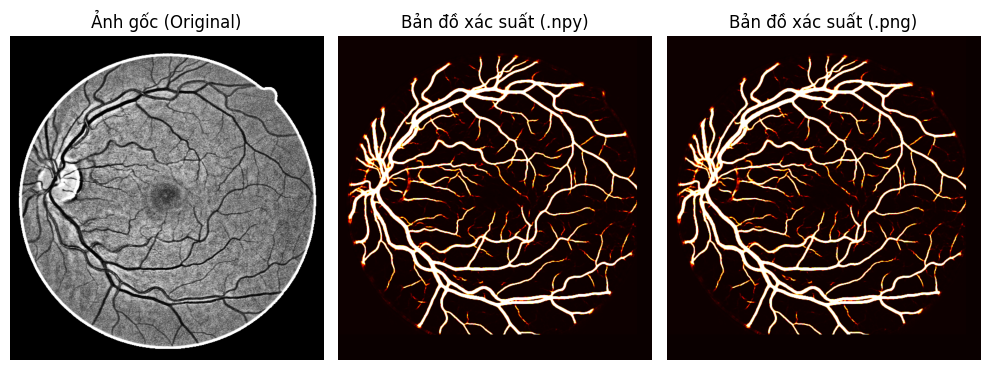

In [ ]:
# plot example
img_name = "01_test_prep.png"
img_dir  = test_dataset.img_dir
prob_dir = "/content/drive/MyDrive/CV/prob_maps/CROSS"

img_path = os.path.join(img_dir, img_name)
prob_npy_path = os.path.join(prob_dir, os.path.splitext(img_name)[0] + "_prob.npy")
prob_png_path = os.path.join(prob_dir, os.path.splitext(img_name)[0] + "_prob.png")

orig = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
prob_map = np.load(prob_npy_path)
prob_png = cv2.imread(prob_png_path, cv2.IMREAD_GRAYSCALE)

print(f"Original: {orig.shape}, ProbMap (.npy): {prob_map.shape}, Prob (.png): {prob_png.shape}")

plt.figure(figsize=(10,5))
plt.subplot(1,3,1)
plt.imshow(orig, cmap='gray')
plt.title("Ảnh gốc (Original)")
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(prob_map, cmap='hot')
plt.title("Bản đồ xác suất (.npy)")
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(prob_png, cmap='hot')
plt.title("Bản đồ xác suất (.png)")
plt.axis('off')
plt.tight_layout()
plt.show()

NX:
- ảnh gốc là ảnh fundus xám sau tiền xử lý
- bản đồ xác suất .npy là output thô của U-Net (giá trị thực 0-1)
- bản đồ xác suất .png là phiên bản đã scale và nén 8 bit
- Các mạch lớn được nhận dạng chính xác, đúng vị trí với bề rộng hợp lý. Các mạch nhỏ xuất hiện rời rạc, một số vùng bị đứt, thiếu liên tục -> chuyển output này vào input của GNN tiếp theo.

Note: muốn thấy rõ sự đứt đoạn mạch máu nhỏ, ta cần lấy skeleton - bộ khung mạch máu hoặc bản nhị phân sau ngưỡng hóa.
- ảnh xs như trên có màu nóng 0-1, mờ mờ. Mạch nhỏ sáng yếu, nhìn chưa rõ liền hay k liền. Hay nói cách khác bản đồ xác suất chứa giá trị liên tục 0–1, vì vậy các mạch nhỏ tuy có xác suất thấp nhưng vẫn hiển thị sáng.
- ảnh nhị phân sau threshold, chỉ giữ lại vùng có xác suất cao, một số mạch mảnh bị loại bỏ.
- skeleton - khunh mảch 1 px, thấy được từng đoạn đứt, mạch mảnh bị mất.-> phân tích cấu trúc, đo continuity.

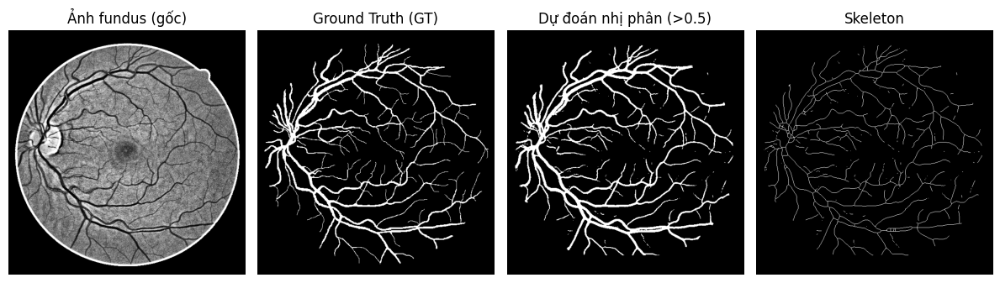

In [ ]:
from skimage.morphology import skeletonize

img_name = "01_test_prep.png"

base_dir = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/CROSS_preprocess/test"
img_dir   = os.path.join(base_dir, "images")
label_dir = os.path.join(base_dir, "labels")
prob_dir  = "/content/drive/MyDrive/CV/prob_maps/CROSS"

base_name = os.path.splitext(img_name)[0]   # '01_test_prep'
img_path  = os.path.join(img_dir, img_name)
gt_path   = os.path.join(label_dir, base_name.replace("_prep", "_gt") + ".png")
prob_path = os.path.join(prob_dir, base_name + "_prob.npy")

orig     = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
gt       = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
gt       = (gt > 0).astype(np.uint8)

if os.path.exists(prob_path):
    prob_map = np.load(prob_path)
else:
    prob_map = cv2.imread(os.path.join(prob_dir, base_name + "_prob.png"), cv2.IMREAD_GRAYSCALE) / 255.0

binary   = (prob_map > 0.5).astype(np.uint8)
skeleton = skeletonize(binary)

plt.figure(figsize=(12,4))
plt.subplot(1,4,1)
plt.imshow(orig, cmap='gray'); plt.title("Ảnh fundus (gốc)"); plt.axis('off')

plt.subplot(1,4,2)
plt.imshow(gt, cmap='gray'); plt.title("Ground Truth (GT)"); plt.axis('off')

plt.subplot(1,4,3)
plt.imshow(binary, cmap='gray'); plt.title("Dự đoán nhị phân (>0.5)"); plt.axis('off')

plt.subplot(1,4,4)
plt.imshow(skeleton, cmap='gray'); plt.title("Skeleton"); plt.axis('off')

plt.tight_layout()
plt.show()

### Stage 2

In [19]:
BASE_PATH = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel"

# RAW
DRIVE_RAW = f"{BASE_PATH}/DRIVE"
STARE_RAW = f"{BASE_PATH}/STARE"

CROSS_PRE = f"{BASE_PATH}/CROSS_preprocess"

SAVE_CROSS_MODEL = "/content/drive/MyDrive/CV/models/unet_cross_best.pth"

PROB_CROSS = "/content/drive/MyDrive/CV/prob_maps/CROSS"

SAVE_DIR = "/content/drive/MyDrive/CV/models"
os.makedirs(SAVE_DIR, exist_ok=True)

CROSS_IMG_TRAIN = f"{CROSS_PRE}/train/images"
CROSS_LBL_TRAIN = f"{CROSS_PRE}/train/labels"
CROSS_IMG_VAL   = f"{CROSS_PRE}/val/images"
CROSS_LBL_VAL   = f"{CROSS_PRE}/val/labels"
CROSS_IMG_TEST  = f"{CROSS_PRE}/test/images"
CROSS_LBL_TEST  = f"{CROSS_PRE}/test/labels"

#### Load Dataset

#### Build Graph

In [20]:
from torch_geometric.data import Data
from skimage.morphology import remove_small_objects, skeletonize

# auto FOV mask: tự động tìm fov
def auto_fov_mask(img):
    if img.ndim == 3:
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    else:
        gray = img.copy()

    # tách foreground - retina với background - đen
    _, mask = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU)
    mask = (mask > 0).astype(np.uint8)
    kernel = np.ones((15,15), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    return mask

def build_graph_from_unet_map(
    prob_map,
    gt_mask,
    patch_shape=(96, 96),
    sample_step=1,
    k_nn=8,
    neg_ratio=0.5
):
    """
    Build graph from U-Net probability map.
    Params:
    - prob_map: (H, W)
    - gt_mask: (H, W)
    - patch_shape: (ph, pw)
    - sample_step: int
    - k_nn: int
    - neg_ratio: float
    Return:
    - data: PyG Data object
    mục tiêu:
    - lấy skeleton từ prob map -> positive nodes
    - lấy negative nodes ở vùng thấp xs (not vessel)
    - trích đặc trưng patch 96x96 quanh node
    - xây graph bằng knn cho GNN làm input học connectivity
    """
    # normalize prob map to [0,1]
    prob_map = prob_map.astype(np.float32)
    if prob_map.max() > 1:
        prob_map = prob_map / 255.0

    H, W = prob_map.shape
    ph, pw = patch_shape

    # FOV mask: - loại bỏ vùng đen
    prob_uint8 = (prob_map * 255).astype(np.uint8)
    fov = auto_fov_mask(prob_uint8)

    prob_map = prob_map * fov
    gt_mask  = gt_mask * fov

    optimal_thr = 0.52
    bin_vessel = (prob_map > optimal_thr).astype(np.uint8)

    # tránh skeleton noise
    bin_vessel = remove_small_objects(bin_vessel.astype(bool), min_size=35)
    bin_vessel = bin_vessel.astype(np.uint8)

    # lưu cleaned vessel
    cleaned = bin_vessel.copy()

    # skeleton - vị trí positive nodes
    skel = skeletonize(bin_vessel).astype(np.uint8)
    ys, xs = np.where(skel == 1)

    if len(ys) == 0:
        return None

    # list chứa features, label, coords, patch region
    feats, labels, coords, clip_ix = [], [], [], []

    # positive nodes - từ skeleton
    for y, x in list(zip(ys, xs))[::sample_step]:

        # bounding box patch 96x96 quanh node
        r1 = max(0, y - ph//2); r2 = r1 + ph
        c1 = max(0, x - pw//2); c2 = c1 + pw

        if r2 > H or c2 > W:
            continue

        raw_patch = prob_map[r1:r2, c1:c2]
        if raw_patch.shape != (ph, pw):
            continue

        # trích xuất đặc trưng
        # biên độ gradient để mô tả local structure
        gx = cv2.Sobel(raw_patch, cv2.CV_32F, 1, 0)
        gy = cv2.Sobel(raw_patch, cv2.CV_32F, 0, 1)
        gmag = np.sqrt(gx**2 + gy**2)

        feat = [
            raw_patch.mean(), # mean prob
            raw_patch.std(), # std prob
            float(prob_map[y, x]), # prob tại node
            float(np.abs(gx).mean()),
            float(np.abs(gy).mean()),
            float(gmag.max()),
            y / H, # tọa độ chuẩn hóa
            x / W,
            1.0 # label positive
        ]

        feats.append(feat)
        labels.append(1)
        coords.append([y, x])
        clip_ix.append([r1, r2, c1, c2])

    pos_count = len(coords)
    if pos_count == 0:
        return None

    # negative nodes - sampling từ vùng background
    num_neg = int(pos_count * neg_ratio)
    neg_coords = []
    tries, max_try = 0, num_neg * 20

    while len(neg_coords) < num_neg and tries < max_try:
        tries += 1

        ny = np.random.randint(0, H)
        nx = np.random.randint(0, W)

        if skel[ny, nx] == 1: continue
        if cleaned[ny, nx] == 1: continue
        if prob_map[ny, nx] > 0.25: continue
        if fov[ny, nx] == 0: continue

        neg_coords.append((ny, nx))

    # thêm negative features
    for (y, x) in neg_coords:

        r1 = max(0, y - ph//2); r2 = r1 + ph
        c1 = max(0, x - pw//2); c2 = c1 + pw

        if r2 > H or c2 > W:
            continue

        raw_patch = prob_map[r1:r2, c1:c2]
        if raw_patch.shape != (ph, pw):
            continue

        # extract gradients tương tự
        gx = cv2.Sobel(raw_patch, cv2.CV_32F, 1, 0)
        gy = cv2.Sobel(raw_patch, cv2.CV_32F, 0, 1)
        gmag = np.sqrt(gx**2 + gy**2)

        feat = [
            raw_patch.mean(),
            raw_patch.std(),
            float(prob_map[y, x]),
            float(np.abs(gx).mean()),
            float(np.abs(gy).mean()),
            float(gmag.max()),
            y / H,
            x / W,
            0.0 # label
        ]

        feats.append(feat)
        labels.append(0)
        coords.append([y, x])
        clip_ix.append([r1, r2, c1, c2])

    # lập graph từ knn
    feats  = torch.tensor(feats, dtype=torch.float32)
    labels = torch.tensor(labels, dtype=torch.float32)
    coords_np = np.array(coords, dtype=np.float32)

    from sklearn.neighbors import kneighbors_graph
    # mỗi node nối với k_nn node gần nhất
    if coords_np.shape[0] > 1:
        knn = kneighbors_graph(coords_np, n_neighbors=min(k_nn, len(coords_np)-1))
        edge_index = torch.tensor(np.vstack(knn.nonzero()), dtype=torch.long)
    else:
        edge_index = torch.zeros((2, 0), dtype=torch.long)

    data = Data(x=feats, y=labels, edge_index=edge_index)
    data.coords  = torch.tensor(coords_np, dtype=torch.float32)
    data.clip_ix = torch.tensor(np.array(clip_ix), dtype=torch.int32)
    data.fov_mask = torch.tensor(fov, dtype=torch.uint8)

    return data

In [21]:
class RetinaPatchGraphDataset(Dataset):
    def __init__(self, prob_dir, gt_dir):
        self.prob_dir = prob_dir
        self.gt_dir = gt_dir

        self.items = sorted([
            os.path.basename(f).replace("_prep_prob.npy", "")
            for f in glob.glob(os.path.join(prob_dir, "*_prep_prob.npy"))
        ])
        print(f"[Dataset] Loaded {len(self.items)} prob maps from {prob_dir}")

    def __getitem__(self, idx):
        base = self.items[idx]

        prob = np.load(os.path.join(self.prob_dir, base + "_prep_prob.npy"))
        if prob.ndim == 3:
            prob = prob[0]
        prob = prob.astype(np.float32)

        gt = np.array(Image.open(os.path.join(self.gt_dir, base + "_gt.png")).convert("L"))
        gt = (gt > 0).astype(np.uint8)

        data = build_graph_from_unet_map(prob, gt)

        if data is None:
            data = Data(
                x=torch.zeros((0, 9)),
                edge_index=torch.zeros((2, 0), dtype=torch.long),
                y=torch.zeros((0,))
            )

        data.img_id = base
        return data

    def __len__(self):
        return len(self.items)

In [ ]:
from PIL import Image

# test graph
prob_dir  = "/content/drive/MyDrive/CV/prob_maps/CROSS_test"
gt_dir    = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/CROSS_preprocess/test/labels"


TEST_NAME = "01_test"

prob_path = os.path.join(prob_dir, TEST_NAME + "_prep_prob.npy")
gt_path   = os.path.join(gt_dir, TEST_NAME + "_gt.png")

prob = np.load(prob_path)
if prob.ndim == 3:
    prob = prob[0]

gt = np.array(Image.open(gt_path).convert("L"))
gt = (gt > 0).astype(np.uint8)

data = build_graph_from_unet_map(prob, gt)

print("\n====== GRAPH SUMMARY ======")
print("Num nodes:", data.x.shape[0])
print("Num edges:", data.edge_index.shape[1])
print("Feature dim:", data.x.shape[1])
print("Positive nodes:", int(data.y.sum().item()))
print("Negative nodes:", int((data.y==0).sum().item()))
print("clip_ix shape:", data.clip_ix.shape)
print("coords shape:", data.coords.shape)

# kiểm tra patch validity
bad = 0
for (r1,r2,c1,c2) in data.clip_ix.numpy():
    if (r2-r1 != 96) or (c2-c1 != 96):
        bad += 1

print("Invalid patches (should be 0):", bad)


====== GRAPH SUMMARY ======
Num nodes: 11495
Num edges: 91960
Feature dim: 9
Positive nodes: 7673
Negative nodes: 3822
clip_ix shape: torch.Size([11495, 4])
coords shape: torch.Size([11495, 2])
Invalid patches (should be 0): 0



Node 8463 | Label = 0 | Patch shape = (96, 96)


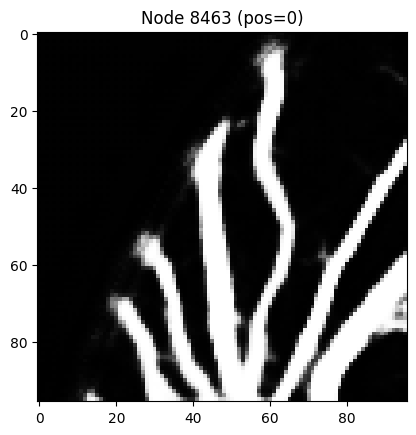


Node 10153 | Label = 0 | Patch shape = (96, 96)


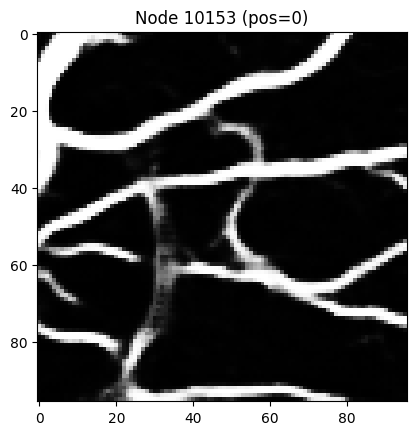


Node 3047 | Label = 1 | Patch shape = (96, 96)


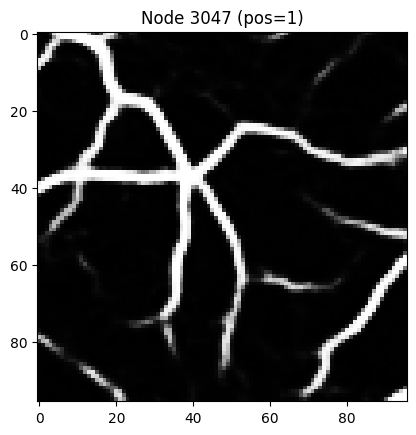


Node 6364 | Label = 1 | Patch shape = (96, 96)


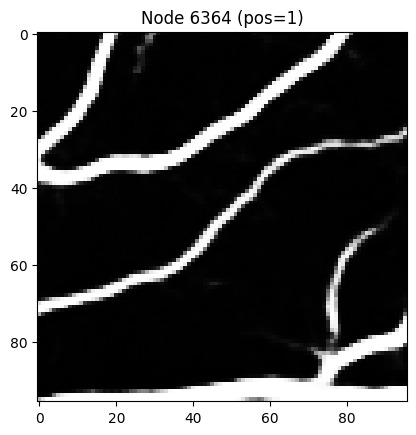


Node 5298 | Label = 1 | Patch shape = (96, 96)


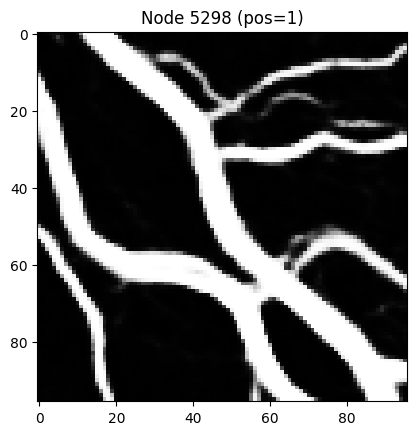

In [ ]:
# visualize random patches
def show_patch(prob, data, node_id):
    r1, r2, c1, c2 = data.clip_ix[node_id].tolist()
    patch = prob[r1:r2, c1:c2]

    print(f"\nNode {node_id} | Label = {int(data.y[node_id])} | Patch shape = {patch.shape}")
    plt.imshow(patch, cmap='gray')
    plt.title(f"Node {node_id} (pos={int(data.y[node_id])})")
    plt.show()

# xem 5 nodes ngẫu nhiên
for nid in np.random.randint(0, len(data.x), 5):
    show_patch(prob, data, nid)

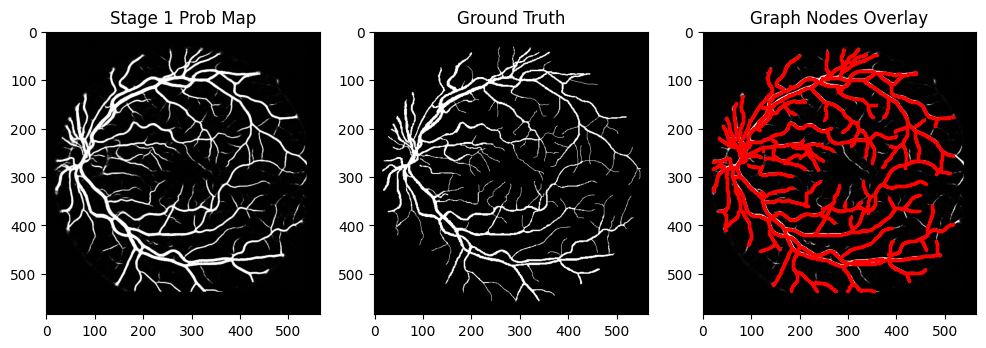

In [ ]:
plt.figure(figsize=(12,4))

# prob map
plt.subplot(1,3,1)
plt.imshow(prob, cmap="gray")
plt.title("Stage 1 Prob Map")

# gt
plt.subplot(1,3,2)
plt.imshow(gt, cmap="gray")
plt.title("Ground Truth")

# graph node overlay
coords = data.coords.cpu().numpy()
labels = data.y.cpu().numpy()

pos = coords[labels == 1]
plt.subplot(1,3,3)
plt.imshow(prob, cmap="gray")
plt.scatter(pos[:,1], pos[:,0], s=2, c='red')
plt.title("Graph Nodes Overlay")
plt.show()

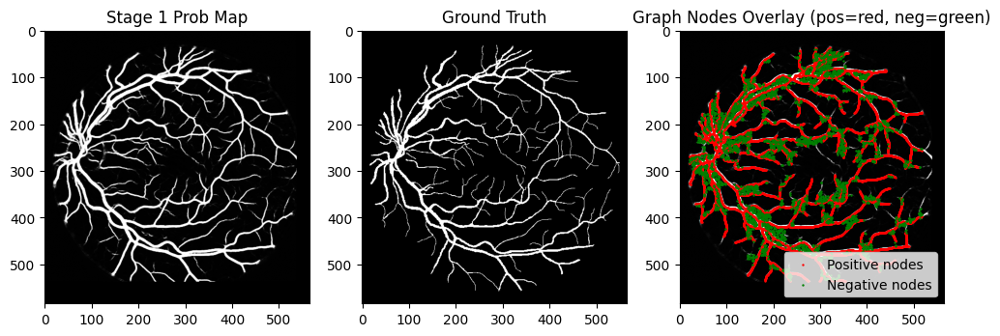

In [ ]:
plt.figure(figsize=(12,4))

# ---- Stage 1 Prob Map ----
plt.subplot(1,3,1)
plt.imshow(prob, cmap="gray")
plt.title("Stage 1 Prob Map")

# ---- GT ----
plt.subplot(1,3,2)
plt.imshow(gt, cmap="gray")
plt.title("Ground Truth")

# ---- Graph Overlay ----
coords = data.coords.cpu().numpy()
labels = data.y.cpu().numpy()

pos = coords[labels == 1]
neg = coords[labels == 0]

plt.subplot(1,3,3)
plt.imshow(prob, cmap="gray")

plt.scatter(pos[:,1], pos[:,0], s=0.5, c='red', label="Positive nodes")
plt.scatter(neg[:,1], neg[:,0], s=0.5, c='green', label="Negative nodes")

plt.legend()
plt.title("Graph Nodes Overlay (pos=red, neg=green)")
plt.show()

In [ ]:
print("Positive nodes:", pos.shape[0])
print("Negative nodes:", neg.shape[0])

Positive nodes: 7673
Negative nodes: 3822


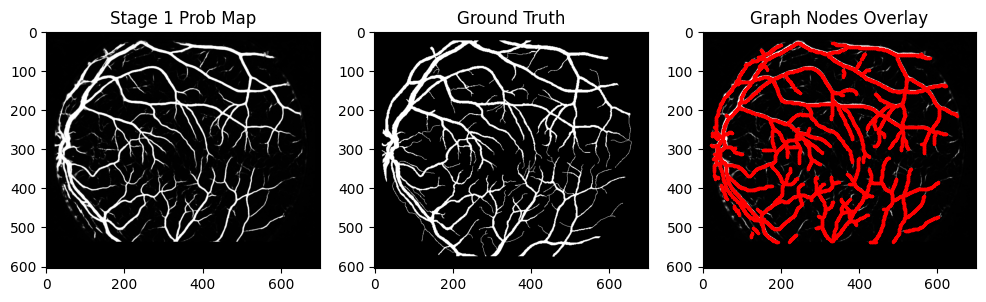

In [ ]:
STARE_NAME = "im0239"   # im0240, im0255, im0291, im0319, im0324

prob_path = f"/content/drive/MyDrive/CV/prob_maps/CROSS_test/{STARE_NAME}_prep_prob.npy"
gt_path   = f"/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/STARE_preprocess/test/labels/{STARE_NAME}_gt.png"

prob = np.load(prob_path).astype(np.float32)
if prob.ndim == 3:
    prob = prob[0]

gt = np.array(Image.open(gt_path).convert("L"))
gt = (gt > 0).astype(np.uint8)

data = build_graph_from_unet_map(prob, gt)
coords = data.coords.cpu().numpy()
labels = data.y.cpu().numpy()

pos = coords[labels == 1]

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(prob, cmap="gray")
plt.title("Stage 1 Prob Map")

plt.subplot(1,3,2)
plt.imshow(gt, cmap="gray")
plt.title("Ground Truth")

plt.subplot(1,3,3)
plt.imshow(prob, cmap="gray")
plt.scatter(pos[:,1], pos[:,0], s=2, c='red')
plt.title("Graph Nodes Overlay")
plt.show()

#### Model GNN

In [22]:
from torch_geometric.nn import GATConv, GraphNorm

class VesselGATPlus(nn.Module):
    """
    GAT 3-layer + GraphNorm + Residual
    Dùng cho feature vector 9 chiều
    """
    def __init__(self, in_dim=9, hidden=64, heads=4, dropout=0.1):
        super().__init__()

        # ---- Layer 1 ----
        self.g1 = GATConv(in_dim, hidden, heads=heads, concat=True, dropout=dropout)
        self.n1 = GraphNorm(hidden * heads)

        # ---- Layer 2 ----
        self.g2 = GATConv(hidden * heads, hidden, heads=heads, concat=True, dropout=dropout)
        self.n2 = GraphNorm(hidden * heads)

        # ---- Layer 3 (reduce to hidden) ----
        self.g3 = GATConv(hidden * heads, hidden, heads=1, concat=False, dropout=dropout)
        self.n3 = GraphNorm(hidden)

        # ---- Output ----
        self.out = nn.Linear(hidden, 1)

        self.drop = nn.Dropout(dropout)

    def forward(self, data):
        x, edge = data.x, data.edge_index

        # ---- Layer 1 ----
        x1 = F.relu(self.n1(self.g1(x, edge)))

        # ---- Layer 2 + residual ----
        x2 = F.relu(self.n2(self.g2(x1, edge))) + x1  # residual here

        # ---- Layer 3 ----
        x3 = F.relu(self.n3(self.g3(x2, edge)))

        x3 = self.drop(x3)

        return self.out(x3)     # logits shape: (N,1)

In [23]:
def merge_patch_graph_datasets(prob_dirs, gt_dirs):
    """
    Tạo list các graph từ nhiều folder prob/gt khác nhau.
    Mỗi ảnh sẽ sinh ra 1 Data object (graph).
    """
    all_graphs = []

    for prob_dir, gt_dir in zip(prob_dirs, gt_dirs):

        prob_files = sorted(glob.glob(os.path.join(prob_dir, "*_prep_prob.npy")))

        for pf in prob_files:
            base = os.path.basename(pf).replace("_prep_prob.npy", "")
            gt_path = os.path.join(gt_dir, base + "_gt.png")

            if not os.path.exists(gt_path):
                print(f"[WARN] Missing GT for {base}, skip!")
                continue

            prob = np.load(pf).astype(np.float32)
            if prob.ndim == 3:
                prob = prob[0]

            gt = np.array(Image.open(gt_path).convert("L"))
            gt = (gt > 0).astype(np.uint8)

            data = build_graph_from_unet_map(prob, gt)
            if data is None:
                continue

            all_graphs.append(data)

    print(f"[OK] Loaded total {len(all_graphs)} graphs")
    return all_graphs

def gnn_dice_loss(logits, target, smooth=1e-6):
    prob = torch.sigmoid(logits).view(-1)
    target = target.view(-1).float()
    inter = (prob * target).sum()
    return 1 - (2 * inter + smooth) / (prob.sum() + target.sum() + smooth)


class GNNCombinedLoss(nn.Module):
    def __init__(self, pos_weight=6.0, alpha=0.7, device="cpu"):
        super().__init__()
        self.alpha = alpha
        self.pos_weight = torch.tensor([pos_weight], device=device)
        self.bce = nn.BCEWithLogitsLoss(pos_weight=self.pos_weight)

    def forward(self, logits, target):
        if logits.dim() == 2:
            logits = logits.squeeze(1)

        bce = self.bce(logits, target.float())
        dice = gnn_dice_loss(logits, target)
        return self.alpha * bce + (1 - self.alpha) * dice

from torch.cuda.amp import autocast, GradScaler

def train_epoch_gnn(model, loader, optimizer, loss_fn, device, scaler):
    model.train()
    total_loss = 0
    tp = fp = fn = tn = 0

    for data in loader:
        data = data.to(device)
        optimizer.zero_grad()

        with autocast():
            logits = model(data).squeeze(1)
            loss = loss_fn(logits, data.y)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()

        prob = torch.sigmoid(logits)
        pred = (prob > 0.5).long()
        target = data.y.long()

        tp += ((pred == 1) & (target == 1)).sum().item()
        tn += ((pred == 0) & (target == 0)).sum().item()
        fp += ((pred == 1) & (target == 0)).sum().item()
        fn += ((pred == 0) & (target == 1)).sum().item()

    precision = tp / (tp + fp + 1e-8)
    recall    = tp / (tp + fn + 1e-8)
    f1 = 2 * precision * recall / (precision + recall + 1e-8)

    return total_loss / len(loader), precision, recall, f1

@torch.no_grad()
def validate_epoch_gnn(model, loader, loss_fn, device):
    model.eval()
    total_loss = 0
    tp = fp = fn = tn = 0

    for data in loader:
        data = data.to(device)

        logits = model(data).squeeze(1)
        loss = loss_fn(logits, data.y)
        total_loss += loss.item()

        prob = torch.sigmoid(logits)
        pred = (prob > 0.5).long()
        target = data.y.long()

        tp += ((pred == 1) & (target == 1)).sum().item()
        tn += ((pred == 0) & (target == 0)).sum().item()
        fp += ((pred == 1) & (target == 0)).sum().item()
        fn += ((pred == 0) & (target == 1)).sum().item()

    precision = tp / (tp + fp + 1e-8)
    recall    = tp / (tp + fn + 1e-8)
    f1 = 2 * precision * recall / (precision + recall + 1e-8)

    return total_loss / len(loader), precision, recall, f1

def train_model_stage2(
    model,
    train_loader,
    val_loader,
    optimizer,
    scheduler,
    loss_fn,
    device,
    num_epochs,
    save_path
):
    scaler = GradScaler()

    best_f1 = 0
    patience = 10
    trigger = 0
    best_wts = None

    history = {
        "train_loss": [], "val_loss": [],
        "train_f1": [], "val_f1": []
    }

    for epoch in range(num_epochs):
        print(f"\n===== Epoch {epoch+1}/{num_epochs} =====")

        train_loss, train_prec, train_rec, train_f1 = train_epoch_gnn(
            model, train_loader, optimizer, loss_fn, device, scaler
        )

        val_loss, val_prec, val_rec, val_f1 = validate_epoch_gnn(
            model, val_loader, loss_fn, device
        )

        scheduler.step(val_loss)

        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_f1"].append(train_f1)
        history["val_f1"].append(val_f1)

        print(f"Train: Loss={train_loss:.4f}, F1={train_f1:.4f}")
        print(f"Val:   Loss={val_loss:.4f}, F1={val_f1:.4f}")

        if val_f1 > best_f1:
            best_f1 = val_f1
            best_wts = copy.deepcopy(model.state_dict())
            torch.save(best_wts, save_path)
            print(f"Saved best model (F1={best_f1:.4f})")
            trigger = 0
        else:
            trigger += 1
            if trigger >= patience:
                print("Early stopping triggered!")
                break

    # load best model
    model.load_state_dict(best_wts)
    print(f"\nTraining done! Best F1 = {best_f1:.4f}")

    # learning curve
    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.plot(history["train_loss"], label="Train Loss")
    plt.plot(history["val_loss"], label="Val Loss")
    plt.legend(); plt.title("Loss Curve"); plt.grid(True)
    plt.subplot(1,2,2)
    plt.plot(history["train_f1"], label="Train F1")
    plt.plot(history["val_f1"], label="Val F1")
    plt.legend(); plt.title("F1 Curve"); plt.grid(True)
    plt.show()

    return model, history

def run_stage2_patchgnn(
    prob_train,
    prob_val,
    gt_train,
    gt_val,
    dataset_name="CROSS",
    max_epochs=80,
    lr=1e-3,
    pos_weight_value=5.0
):

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"\nStage 2 Patch-GNN Training on {dataset_name}")

    train_graphs = merge_patch_graph_datasets([prob_train], [gt_train])
    val_graphs   = merge_patch_graph_datasets([prob_val], [gt_val])

    train_loader = GeoLoader(train_graphs, batch_size=1, shuffle=True)
    val_loader   = GeoLoader(val_graphs, batch_size=1)

    # model
    model = VesselGATPlus(in_dim=9, hidden=64).to(device)
    loss_fn = GNNCombinedLoss(pos_weight=pos_weight_value, device=device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='min', patience=5, factor=0.5
    )

    save_path = f"/content/drive/MyDrive/CV/models/stage2_patchgnn_{dataset_name}.pth"

    model, history = train_model_stage2(
        model,
        train_loader,
        val_loader,
        optimizer,
        scheduler,
        loss_fn,
        device,
        max_epochs,
        save_path
    )

    return save_path, history

#### Start Training


=== Stage 2 Patch-GNN Training on CROSS ===
[OK] Loaded total 27 graphs
[OK] Loaded total 7 graphs

===== Epoch 1/80 =====


/tmp/ipython-input-2366706725.py:138: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()
/tmp/ipython-input-2366706725.py:74: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Train: Loss=0.4670, F1=0.9155
Val:   Loss=0.3114, F1=0.9408
Saved best model (F1=0.9408)

===== Epoch 2/80 =====
Train: Loss=0.2914, F1=0.9414
Val:   Loss=0.2294, F1=0.9465
Saved best model (F1=0.9465)

===== Epoch 3/80 =====
Train: Loss=0.2298, F1=0.9443
Val:   Loss=0.1872, F1=0.9499
Saved best model (F1=0.9499)

===== Epoch 4/80 =====
Train: Loss=0.1919, F1=0.9479
Val:   Loss=0.1588, F1=0.9561
Saved best model (F1=0.9561)

===== Epoch 5/80 =====
Train: Loss=0.1646, F1=0.9541
Val:   Loss=0.1432, F1=0.9619
Saved best model (F1=0.9619)

===== Epoch 6/80 =====
Train: Loss=0.1524, F1=0.9577
Val:   Loss=0.1348, F1=0.9617

===== Epoch 7/80 =====
Train: Loss=0.1375, F1=0.9618
Val:   Loss=0.1399, F1=0.9647
Saved best model (F1=0.9647)

===== Epoch 8/80 =====
Train: Loss=0.1301, F1=0.9639
Val:   Loss=0.1268, F1=0.9663
Saved best model (F1=0.9663)

===== Epoch 9/80 =====
Train: Loss=0.1236, F1=0.9653
Val:   Loss=0.1313, F1=0.9655

===== Epoch 10/80 =====
Train: Loss=0.1217, F1=0.9657
Val:   Los

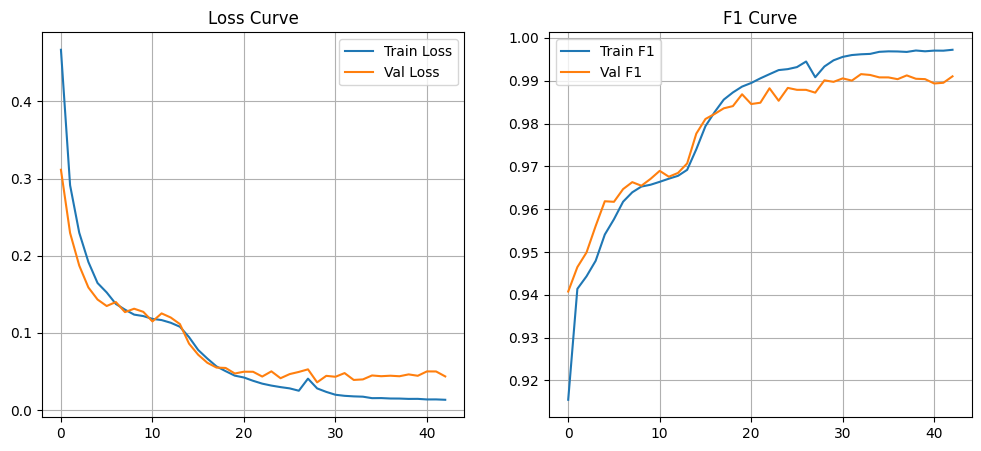

In [ ]:
CROSS_IMG_TRAIN = f"{CROSS_PRE}/train/images"
CROSS_LBL_TRAIN = f"{CROSS_PRE}/train/labels"

CROSS_IMG_VAL   = f"{CROSS_PRE}/val/images"
CROSS_LBL_VAL   = f"{CROSS_PRE}/val/labels"

CROSS_IMG_TEST  = f"{CROSS_PRE}/test/images"
CROSS_LBL_TEST  = f"{CROSS_PRE}/test/labels"
PM_TRAIN = "/content/drive/MyDrive/CV/prob_maps/CROSS_train"
PM_VAL   = "/content/drive/MyDrive/CV/prob_maps/CROSS_val"

LBL_TRAIN = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/CROSS_preprocess/train/labels"
LBL_VAL   = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/CROSS_preprocess/val/labels"

cross_path, hist = run_stage2_patchgnn(
    prob_train=PM_TRAIN,
    prob_val=PM_VAL,
    gt_train=LBL_TRAIN,
    gt_val=LBL_VAL,
    dataset_name="CROSS",
    max_epochs=80,
    lr=1e-3,
    pos_weight_value=2
)

### Evaluation

In [24]:
from torch.amp import autocast

# FOV mask
def auto_fov_mask(img):
    return (img > 0).astype(np.float32)

# load model
def load_stage2_model(model_path):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = VesselGATPlus(
        in_dim=9,
        hidden=64,
        heads=4,
        dropout=0.1
    ).to(device)

    state = torch.load(model_path, map_location=device)
    model.load_state_dict(state)
    model.eval()

    return model, device

# từ pred cho node -> gen img
def refine_full_image(prob_map, data, node_probs, fov=None):

    H, W = prob_map.shape
    # mỗi node tương ứng với patch 96x96
    gate = np.zeros((H, W), dtype=np.float32) # cumulative
    count = np.zeros((H, W), dtype=np.float32)

    clip = data.clip_ix.cpu().numpy()  # mỗi node có bounding box [r1,r2,c1,c2]

    for i in range(len(node_probs)):
        r1, r2, c1, c2 = clip[i]
        gate[r1:r2, c1:c2] += node_probs[i] # thêm xs node vào vùng patch
        count[r1:r2, c1:c2] += 1

    count[count == 0] = 1
    gate /= count

    # nếu prob thấp nhưng gnn tự tin -> nâng mạnh vessel
    # nếu prob cao -> tăng ít
    refined = prob_map + 0.4 * gate * (1 - prob_map)
    refined = np.clip(refined, 0, 1)

    if fov is not None:
        refined *= fov # skip range out of FOV

    return refined

def compute_metrics(pred, gt):
    tp = np.sum((pred==1) & (gt==1))
    tn = np.sum((pred==0) & (gt==0))
    fp = np.sum((pred==1) & (gt==0))
    fn = np.sum((pred==0) & (gt==1))

    prec = tp / (tp + fp + 1e-8)
    rec  = tp / (tp + fn + 1e-8)
    f1   = 2 * prec * rec / (prec + rec + 1e-8)

    return dict(F1=f1, Precision=prec, Recall=rec)

def evaluate_stage2_full(model_path, prob_dir, gt_dir):

    model, device = load_stage2_model(model_path)

    results = []

    for pf in sorted(os.listdir(prob_dir)):
        if not pf.endswith("_prep_prob.npy"):
            continue

        base = pf.replace("_prep_prob.npy", "")

        # load prob
        prob = np.load(os.path.join(prob_dir, pf))
        if prob.ndim == 3:
            prob = prob[0]
        prob = prob.astype(np.float32)
        if prob.max() > 1:
            prob /= 255.0

        # load gt
        gt_path = os.path.join(gt_dir, base + "_gt.png")
        gt = np.array(Image.open(gt_path).convert("L"))
        gt = (gt > 0).astype(np.uint8)

        # build graph
        data = build_graph_from_unet_map(prob, gt)
        if data is None:
            print(f"[SKIP] {base} – no nodes")
            continue

        # FOV mask
        prob_uint8 = (prob * 255).astype(np.uint8)
        fov = auto_fov_mask(prob_uint8)

        data = data.to(device)

        # GNN INFERENCE
        with torch.no_grad(), autocast("cuda"):
            logits = model(data).squeeze(1)
            node_probs = torch.sigmoid(logits).cpu().numpy()

        # tái tạo refined prob map từ node predictions
        refined = refine_full_image(prob, data, node_probs, fov=fov)
        pred_bin = (refined > 0.5).astype(np.uint8)

        m = compute_metrics(pred_bin, gt)
        results.append(m)

        print(f"[{base}]  F1={m['F1']:.4f}   P={m['Precision']:.4f}   R={m['Recall']:.4f}")

    return results

In [ ]:
results = evaluate_stage2_full(
    model_path=cross_path,
    prob_dir="/content/drive/MyDrive/CV/prob_maps/CROSS_test",
    gt_dir="/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/CROSS_preprocess/test/labels"
)

[01_test]  F1=0.8090   P=0.7575   R=0.8679
[02_test]  F1=0.8395   P=0.8314   R=0.8478
[03_test]  F1=0.7928   P=0.8491   R=0.7434
[04_test]  F1=0.8216   P=0.8438   R=0.8005
[05_test]  F1=0.8061   P=0.8650   R=0.7547
[06_test]  F1=0.7981   P=0.8535   R=0.7494
[07_test]  F1=0.8071   P=0.8408   R=0.7759
[08_test]  F1=0.7871   P=0.8292   R=0.7490
[09_test]  F1=0.7963   P=0.8395   R=0.7574
[10_test]  F1=0.7957   P=0.7989   R=0.7925
[11_test]  F1=0.7955   P=0.7993   R=0.7918
[12_test]  F1=0.8149   P=0.8095   R=0.8204
[13_test]  F1=0.8105   P=0.8320   R=0.7900
[14_test]  F1=0.8097   P=0.7777   R=0.8445
[15_test]  F1=0.7991   P=0.7541   R=0.8499
[16_test]  F1=0.8209   P=0.8156   R=0.8263
[17_test]  F1=0.7977   P=0.8100   R=0.7858
[18_test]  F1=0.7909   P=0.7434   R=0.8449
[19_test]  F1=0.8309   P=0.7728   R=0.8985
[20_test]  F1=0.7981   P=0.7388   R=0.8679
[im0239]  F1=0.7846   P=0.9300   R=0.6785
[im0240]  F1=0.7304   P=0.9501   R=0.5932
[im0255]  F1=0.8017   P=0.9168   R=0.7122
[im0291]  F1=0


=== Visualizing 01_test ===


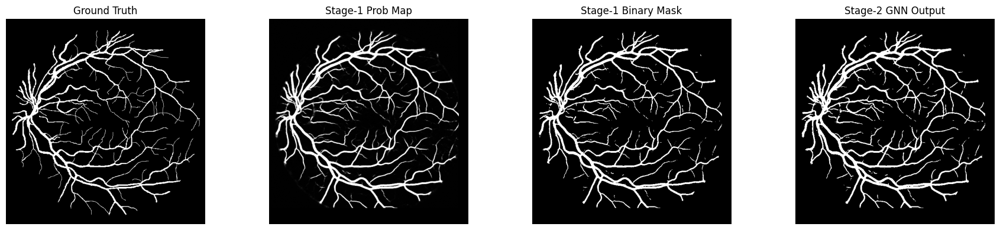


=== Visualizing 02_test ===


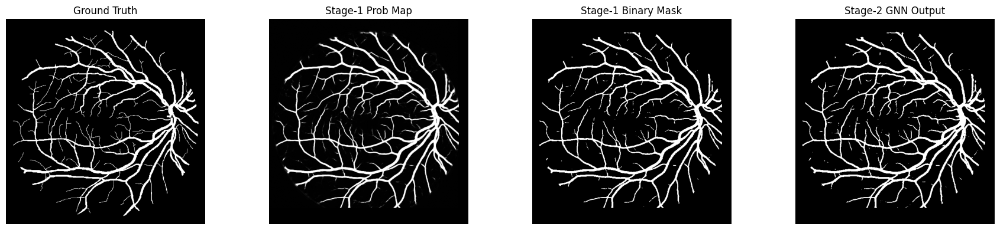


=== Visualizing 03_test ===


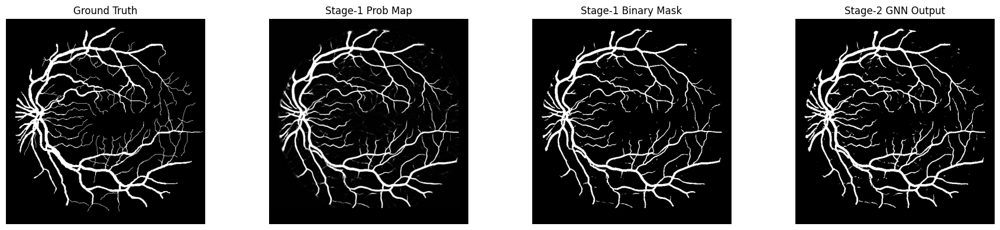


=== Visualizing 04_test ===


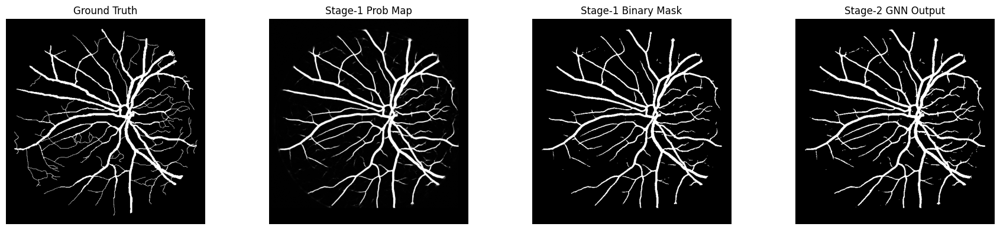


=== Visualizing 05_test ===


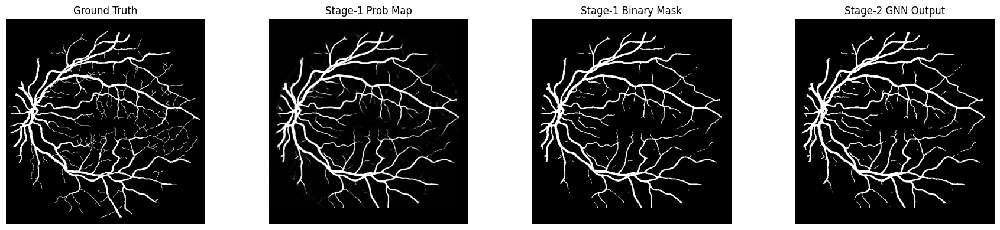


=== Visualizing 06_test ===


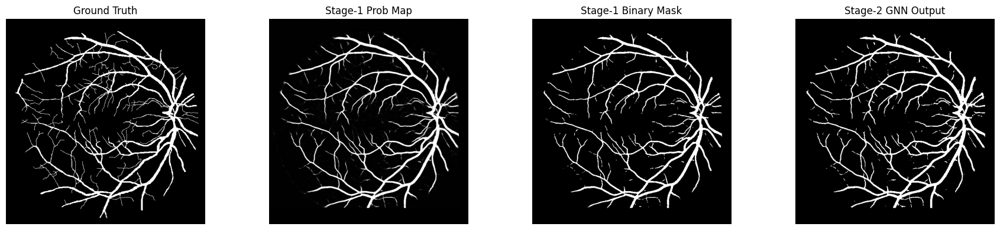


=== Visualizing 07_test ===


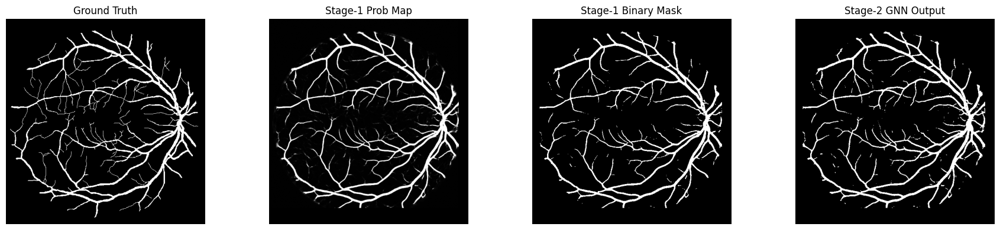


=== Visualizing 08_test ===


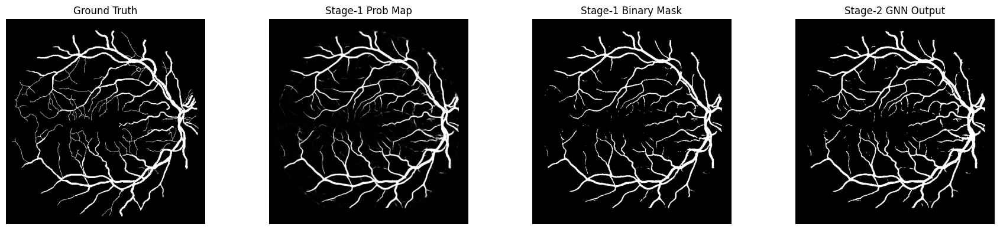


=== Visualizing 09_test ===


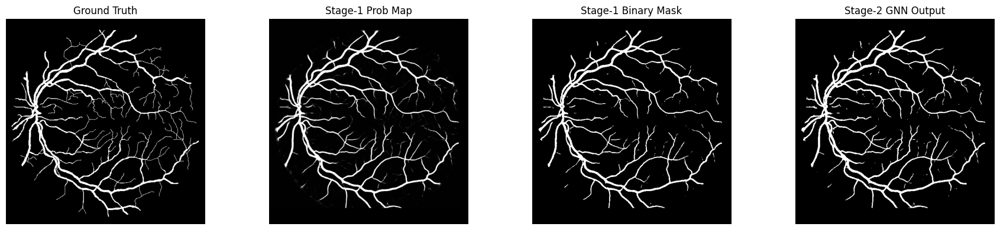


=== Visualizing 10_test ===


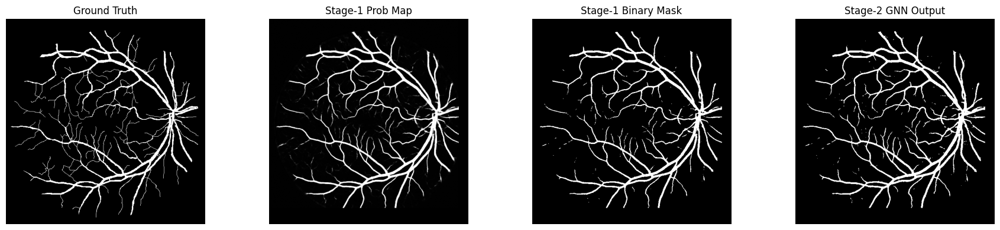


=== Visualizing 11_test ===


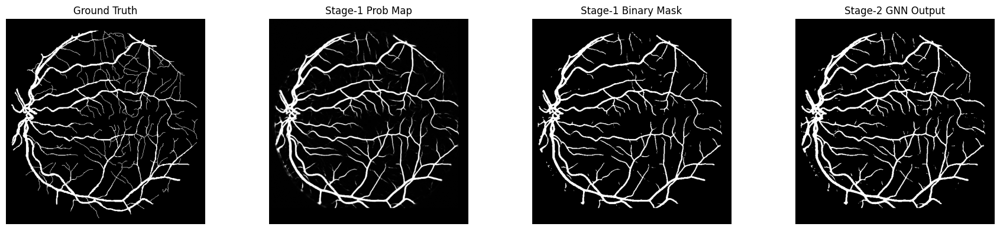


=== Visualizing 12_test ===


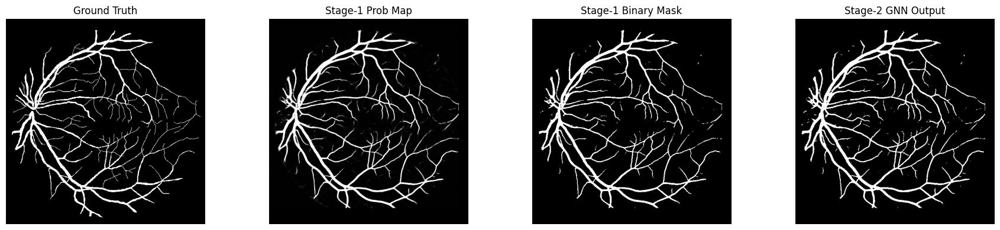


=== Visualizing 13_test ===


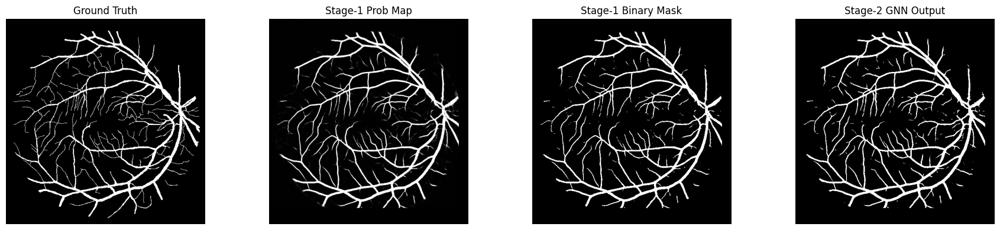


=== Visualizing 14_test ===


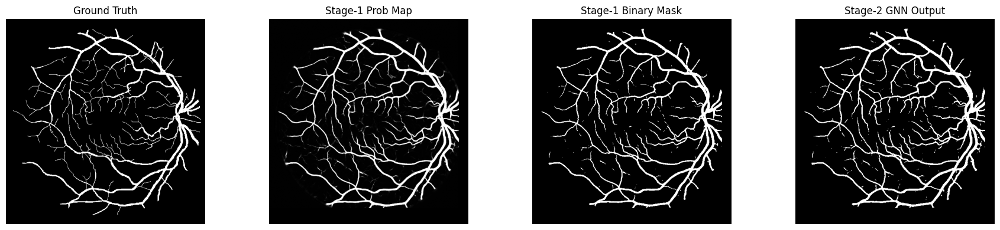


=== Visualizing 15_test ===


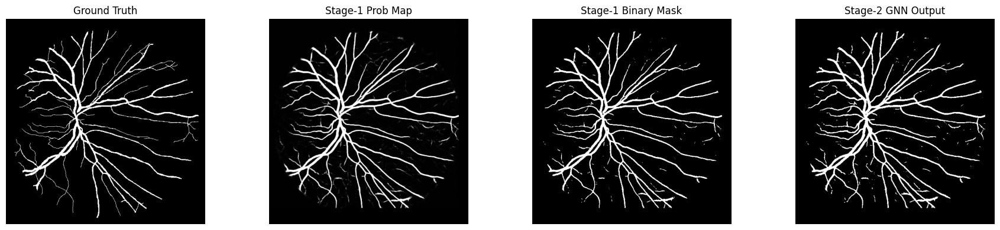


=== Visualizing 16_test ===


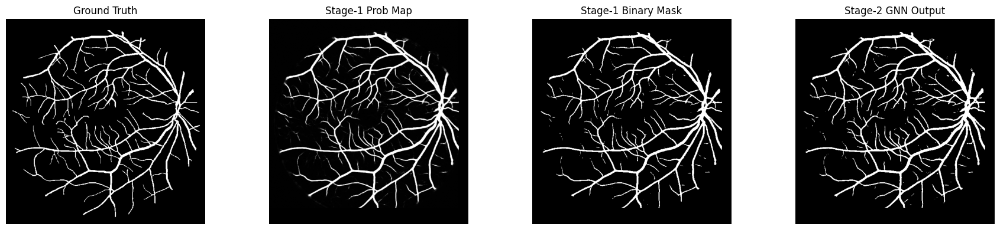


=== Visualizing 17_test ===


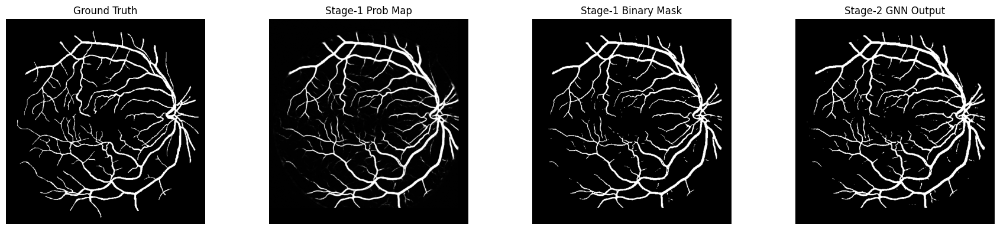


=== Visualizing 18_test ===


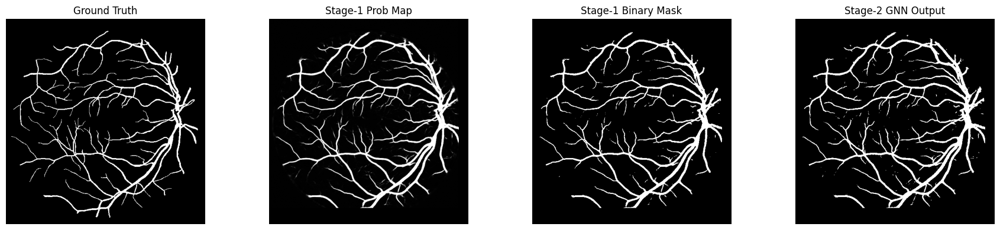


=== Visualizing 19_test ===


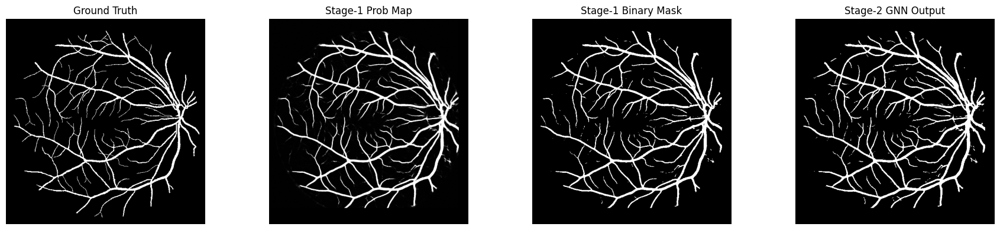


=== Visualizing 20_test ===


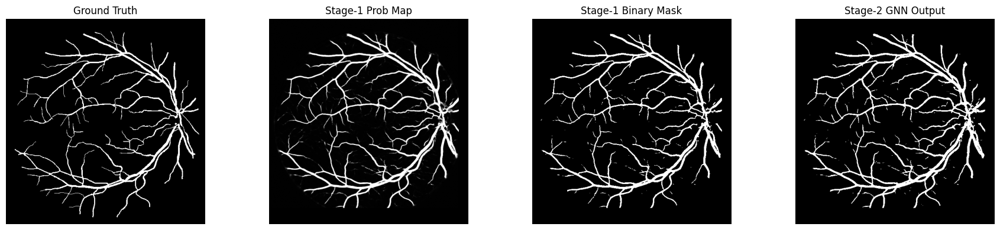


=== Visualizing im0239 ===


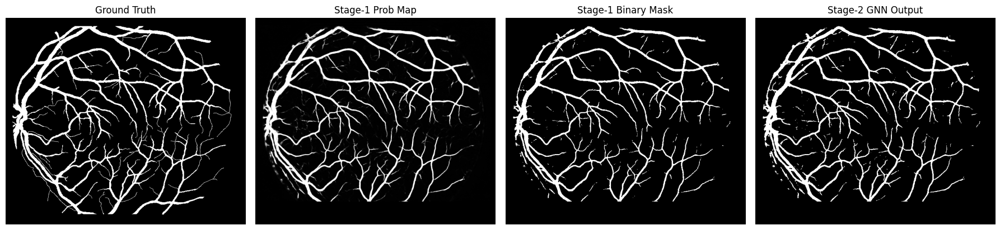


=== Visualizing im0240 ===


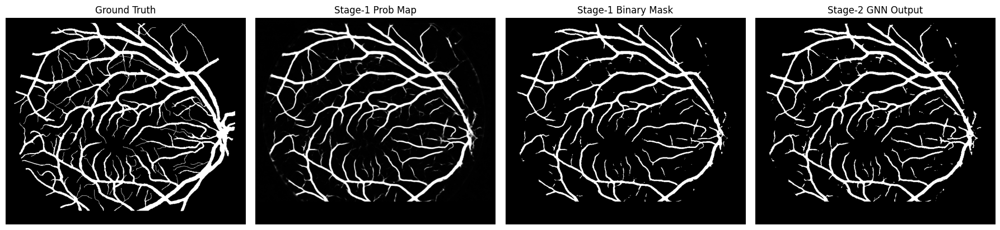


=== Visualizing im0255 ===


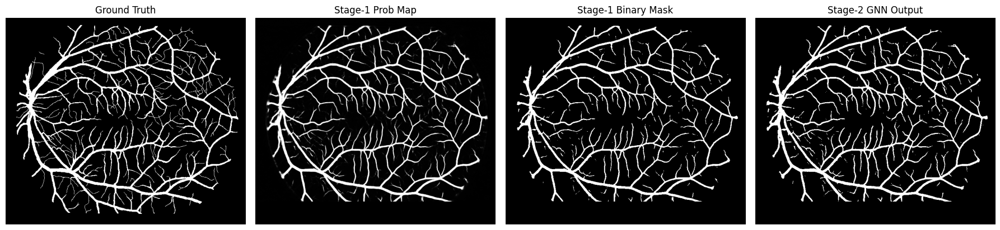


=== Visualizing im0291 ===


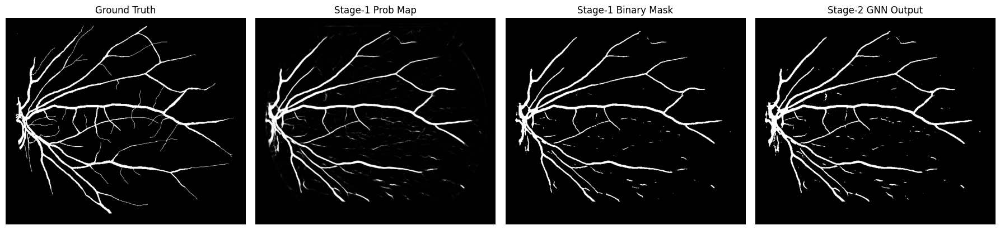


=== Visualizing im0319 ===


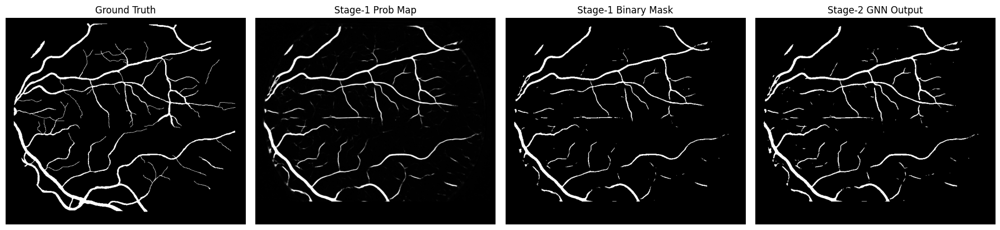


=== Visualizing im0324 ===


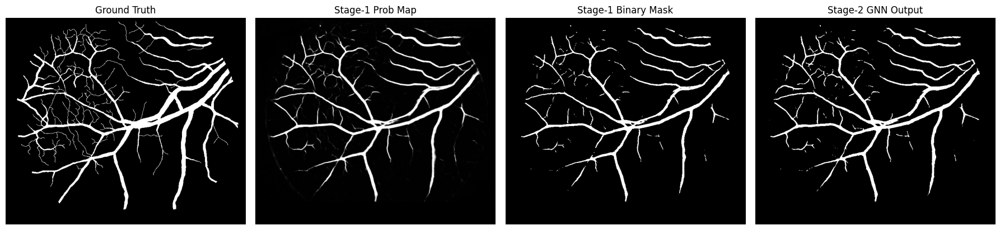

In [ ]:
def visualize_test_case(base, prob_dir, gt_dir, model, device):

    # Load Stage-1 prob map
    prob = np.load(os.path.join(prob_dir, base + "_prep_prob.npy"))
    if prob.ndim == 3:
        prob = prob[0]
    prob = prob.astype(np.float32)
    if prob.max() > 1:
        prob /= 255.0

    gt = np.array(Image.open(os.path.join(gt_dir, base + "_gt.png")).convert("L"))
    gt = (gt > 0).astype(np.uint8)

    data = build_graph_from_unet_map(prob, gt)
    data = data.to(device)

    # run gnn
    with torch.no_grad(), autocast("cuda"):
        logits = model(data).squeeze(1)
        node_probs = torch.sigmoid(logits).cpu().numpy()

    # refine using gnn
    fov = auto_fov_mask((prob * 255).astype(np.uint8))
    refined = refine_full_image(prob, data, node_probs, fov=fov)
    refined_bin = (refined > 0.5).astype(np.uint8)

    # stage 1 binary mask
    stage1_bin = (prob > 0.52).astype(np.uint8)

    plt.figure(figsize=(18, 4))
    titles = [
        "Ground Truth",
        "Stage-1 Prob Map",
        "Stage-1 Binary Mask",
        "Stage-2 GNN Output"
    ]

    images = [gt, prob, stage1_bin, refined_bin]

    for i in range(4):
        plt.subplot(1, 4, i + 1)
        plt.imshow(images[i], cmap="gray")
        plt.title(titles[i], fontsize=12)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

prob_dir = "/content/drive/MyDrive/CV/prob_maps/CROSS_test"
gt_dir   = "/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/CROSS_preprocess/test/labels"

model_path = "/content/drive/MyDrive/CV/models/stage2_patchgnn_CROSS.pth"
model, device = load_stage2_model(model_path)

prob_files = sorted([f for f in os.listdir(prob_dir) if f.endswith("_prep_prob.npy")])

for pf in prob_files:
    base = pf.replace("_prep_prob.npy", "")
    print(f"\n=== Visualizing {base} ===")
    visualize_test_case(base, prob_dir, gt_dir, model, device)

In [ ]:
def save_stage2_outputs(model_path, prob_dir, gt_dir, save_dir):
    os.makedirs(save_dir, exist_ok=True)

    model, device = load_stage2_model(model_path)

    for pf in sorted(os.listdir(prob_dir)):
        if not pf.endswith("_prep_prob.npy"):
            continue

        base = pf.replace("_prep_prob.npy", "")

        prob = np.load(os.path.join(prob_dir, pf)).astype(np.float32)
        if prob.max() > 1:
            prob /= 255.0

        # load GT
        gt_path = os.path.join(gt_dir, base + "_gt.png")
        gt = np.array(Image.open(gt_path).convert("L"))
        gt = (gt > 0).astype(np.uint8)

        # build graph
        data = build_graph_from_unet_map(prob, gt)
        if data is None:
            continue

        prob_uint8 = (prob * 255).astype(np.uint8)
        fov = auto_fov_mask(prob_uint8)

        data = data.to(device)

        # run GNN
        with torch.no_grad(), autocast("cuda"):
            logits = model(data).squeeze(1)
            node_probs = torch.sigmoid(logits).cpu().numpy()

        refined = refine_full_image(prob, data, node_probs, fov=fov)
        refined_bin = (refined > 0.5).astype(np.uint8)

        # save npy
        np.save(os.path.join(save_dir, base + "_stage2.npy"), refined)

        # save png
        cv2.imwrite(os.path.join(save_dir, base + "_stage2.png"),
                    (refined_bin * 255).astype(np.uint8))

        print(f"[SAVED] {base} → {save_dir}/{base}_stage2.*")

save_stage2_outputs(
    model_path="/content/drive/MyDrive/CV/models/stage2_patchgnn_CROSS.pth",
    prob_dir="/content/drive/MyDrive/CV/prob_maps/CROSS_test",
    gt_dir="/content/drive/MyDrive/CV/data/extracted_retinal_vessel/Retinal Vessel/CROSS_preprocess/test/labels",
    save_dir="/content/drive/MyDrive/CV/stage2_outputs"
)

### View Viz


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# load model cnn
SAVE_CROSS_MODEL = "/content/drive/MyDrive/CV/models/unet_cross_best.pth"
model_stage1 = UNet(num_channels=1, num_classes=1).to(device)
model_stage1.load_state_dict(torch.load(SAVE_CROSS_MODEL, map_location=device))
model_stage1.eval()
print("Loaded Stage-1:", SAVE_CROSS_MODEL)

# load model gnn
SAVE_STAGE2 = "/content/drive/MyDrive/CV/models/stage2_patchgnn_CROSS.pth"
model_stage2 = VesselGATPlus(in_dim=9, hidden=64).to(device)
model_stage2.load_state_dict(torch.load(SAVE_STAGE2, map_location=device))
model_stage2.eval()
print("Loaded Stage-2:", SAVE_STAGE2)

Loaded Stage-1: /content/drive/MyDrive/CV/models/unet_cross_best.pth
Loaded Stage-2: /content/drive/MyDrive/CV/models/stage2_patchgnn_CROSS.pth


## Demo

In [ ]:
!pip install gradio -q

In [31]:
import gradio as gr

# load stage 1 model
model_unet_stage1 = UNet(num_channels=1, num_classes=1).to(device)
model_unet_stage1.load_state_dict(torch.load(SAVE_CROSS_MODEL, map_location=device))
model_unet_stage1.eval()

# load stage 2 model
stage2_model, device = load_stage2_model(
    "/content/drive/MyDrive/CV/models/stage2_patchgnn_CROSS.pth"
)

def _get_expanded_patch_from_array(img_array, y, x, patch_size, expand_by):
    h, w = img_array.shape
    half = expand_by // 2
    y0, y1 = y - half, y + patch_size + half
    x0, x1 = x - half, x + patch_size + half

    pad_top   = max(0, -y0)
    pad_left  = max(0, -x0)
    pad_bot   = max(0,  y1 - h)
    pad_right = max(0,  x1 - w)

    y0 = max(0, y0); x0 = max(0, x0)
    y1 = min(h, y1); x1 = min(w, x1)
    patch = img_array[y0:y1, x0:x1]

    if pad_top or pad_bot or pad_left or pad_right:
        patch = np.pad(patch, ((pad_top, pad_bot), (pad_left, pad_right)), mode='reflect')
    return patch

def generate_probability_map_from_array(model, img_array_preprocessed, device, patch_size=388, expand_by=184, patch_offset=150, batch_size=8):
    model.to(device)
    model.eval()

    H, W = img_array_preprocessed.shape
    expanded_size = patch_size + expand_by # 572

    prob_acc = np.zeros((H, W), dtype=np.float32)
    count_acc = np.zeros((H, W), dtype=np.float32)

    patches_to_process = []
    patch_info_list = []

    for y_start in range(0, max(1, H - patch_size + 1), patch_offset):
        for x_start in range(0, max(1, W - patch_size + 1), patch_offset):
            y_clip = min(y_start, H - patch_size)
            x_clip = min(x_start, W - patch_size)

            img_exp = _get_expanded_patch_from_array(img_array_preprocessed, y_clip, x_clip, patch_size, expand_by)

            # if img_exp.shape != (expanded_size, expanded_size):
                # img_exp = cv2.resize(img_exp, (expanded_size, expanded_size), interpolation=cv2.INTER_LINEAR)
            if img_exp.shape != (expanded_size, expanded_size):

              h0, w0 = img_exp.shape

              pad_h = expanded_size - h0
              pad_w = expanded_size - w0

              pad_top = pad_h // 2
              pad_bottom = pad_h - pad_top
              pad_left = pad_w // 2
              pad_right = pad_w - pad_left

              img_exp = np.pad(
                  img_exp,
                  ((pad_top, pad_bottom), (pad_left, pad_right)),
                  mode="reflect"
              )

            patches_to_process.append(img_exp)
            patch_info_list.append((y_clip, y_clip + patch_size, x_clip, x_clip + patch_size))

    if not patches_to_process:
        if H < expanded_size or W < expanded_size:
            padded_img = np.pad(img_array_preprocessed,
                                ((0, max(0, expanded_size - H)), (0, max(0, expanded_size - W))),
                                mode='reflect')
            padded_img = cv2.resize(padded_img, (expanded_size, expanded_size), interpolation=cv2.INTER_LINEAR)

            img_t = torch.from_numpy(padded_img).unsqueeze(0).unsqueeze(0).float().to(device)
            with torch.no_grad():
                logits = model(img_t)
                probs = torch.sigmoid(logits).cpu().numpy()

            unet_output_h, unet_output_w = probs.shape[-2:]
            central_prob_output = probs[0, 0, :unet_output_h, :unet_output_w]
            return cv2.resize(central_prob_output, (W, H), interpolation=cv2.INTER_CUBIC)
        else:
            return np.zeros((H, W), dtype=np.float32)


    with torch.no_grad():
        for i in range(0, len(patches_to_process), batch_size):
            batch_imgs = patches_to_process[i:i+batch_size]
            batch_clips = patch_info_list[i:i+batch_size]

            imgs_np = np.stack(batch_imgs, axis=0)
            imgs_t = torch.from_numpy(imgs_np).unsqueeze(1).float().to(device) # [B, 1, expanded, expanded]

            logits = model(imgs_t)                       # [B,1,388,388] (output UNET)
            probs = torch.sigmoid(logits).cpu().numpy()

            for bi, clip in enumerate(batch_clips):
                y0, y1, x0, x1 = clip
                prob_patch = probs[bi, 0, :, :] # [388, 388]
                prob_acc[y0:y1, x0:x1] += prob_patch
                count_acc[y0:y1, x0:x1] += 1.0

    mask = count_acc > 0
    prob_map = np.zeros_like(prob_acc, dtype=np.float32)
    prob_map[mask] = prob_acc[mask] / count_acc[mask]

    if prob_map.shape != (H, W):
        prob_map = cv2.resize(prob_map, (W, H), interpolation=cv2.INTER_CUBIC)

    return prob_map


def run_pipeline(fundus_img_pil):
    fundus_img_np = np.array(fundus_img_pil)

    orig_H, orig_W = fundus_img_np.shape[:2]

    # convert grayscale
    if fundus_img_np.ndim == 3 and fundus_img_np.shape[2] == 3:
        gray_img = cv2.cvtColor(fundus_img_np, cv2.COLOR_RGB2GRAY)
    else:
        gray_img = fundus_img_np

    mtht_img = multiscale_tophat_entropy(gray_img)
    clahe_img = apply_CLAHE(mtht_img)
    norm_img = zscore_normalize(clahe_img)

    # Stage 1 U-Net: Generate full probability map
    prob_map = generate_probability_map_from_array(
        model_unet_stage1,
        norm_img, # preprocessed image array
        device,
        patch_size=388,
        expand_by=184,
        patch_offset=150,
        batch_size=8 # chung batch size vs training
    )

    # Stage 1 binary output
    stage1_bin = (prob_map > 0.52).astype(np.uint8) * 255

    # build graph từ biểu đồ xs
    gt_dummy = np.zeros_like(prob_map, dtype=np.uint8)
    data = build_graph_from_unet_map(prob_map, gt_dummy)

    if data is None or data.x.shape[0] == 0:
        return fundus_img_pil, Image.fromarray(stage1_bin), Image.fromarray(stage1_bin)

    data = data.to(device)

    # Stage 2 GNN inference
    with torch.no_grad(), torch.amp.autocast("cuda"):
        logits = stage2_model(data).squeeze(1) # Logits for each node
        node_probs = torch.sigmoid(logits).cpu().numpy() # Node probabilities

    # Refine full image using GNN node predictions
    prob_uint8 = (prob_map * 255).astype(np.uint8)
    fov = auto_fov_mask(prob_uint8)
    refined_prob = refine_full_image(prob_map, data, node_probs, fov=fov)

    # Stage 2 Refined binary output
    stage2_bin = (refined_prob > 0.52).astype(np.uint8) * 255

    return (
        Image.fromarray(fundus_img_np),
        Image.fromarray(stage1_bin),
        Image.fromarray(stage2_bin)
    )

In [ ]:
demo = gr.Interface(
    fn=run_pipeline,
    inputs=gr.Image(type="pil", label="Upload fundus image"),
    outputs=[
        gr.Image(label="Original"),
        gr.Image(label="Stage-1"),
        gr.Image(label="Stage-2"),
    ],
    title="Retinal Vessel Segmentation",
    description="Upload a fundus image → Stage1 CNN outputs binary map → Stage2 GNN refines topology."
)

demo.launch(debug=True)

### Bổ sung

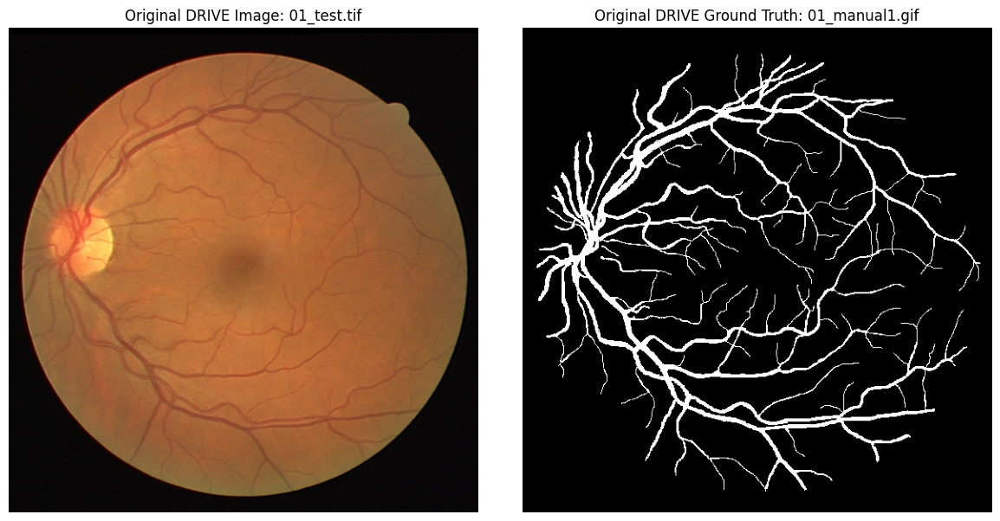

In [35]:
# chọn ảnh test
img_filename = '01_test.tif'

original_img_path = os.path.join(drive_test_img_dir, img_filename)

# lấy gt
gt_filename = img_filename.replace('_test.tif', '_manual1.gif')
original_gt_path = os.path.join(drive_test_gt_dir, gt_filename)

original_image = cv2.imread(original_img_path, cv2.IMREAD_COLOR)

ground_truth_image = cv2.imread(original_gt_path, cv2.IMREAD_GRAYSCALE)

if original_image is None:
    print(f"Error: Could not load original image from {original_img_path}")
elif ground_truth_image is None:
    print(f"Error: Could not load ground truth image from {original_gt_path}")
else:
    # chuyển đổi ảnh gốc từ BGR sang RGB
    original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)

    plt.imshow(original_image_rgb)
    plt.title(f"Original DRIVE Image: {img_filename}")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(ground_truth_image, cmap='gray')
    plt.title(f"Original DRIVE Ground Truth: {gt_filename}")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [43]:
def crop_roi(img, center, size):
    """
    Cắt ROI vuông từ ảnh.
    img    : np.array (H,W) hoặc (H,W,3)
    center : (cy, cx) - toạ độ tâm ROI (theo trục ảnh)
    size   : chiều dài cạnh ROI (pixel)
    """
    h, w = img.shape[:2]
    cy, cx = center
    half = size // 2

    y0 = max(0, cy - half)
    y1 = min(h, cy + half)
    x0 = max(0, cx - half)
    x1 = min(w, cx + half)

    return img[y0:y1, x0:x1]

def analyze_rois_on_drive_example(
    original_image_bgr,
    ground_truth_image,
    roi_size=256
):
    """
    Trả về:
      rois_output = {
         "OD – mạch lớn": {
             "original": roi_orig,
             "stage1": roi_s1,
             "stage2": roi_s2,
             "gt": roi_gt
         },
         ...
      }
    Đồng thời hiển thị figure.
    """

    fundus_rgb = cv2.cvtColor(original_image_bgr, cv2.COLOR_BGR2RGB)
    fundus_pil = Image.fromarray(fundus_rgb)

    # chạy inference stage 1 + stage 2
    fundus_out_pil, stage1_pil, stage2_pil = run_pipeline(fundus_pil)

    stage1_bin = np.array(stage1_pil)
    stage2_bin = np.array(stage2_pil)

    H, W = ground_truth_image.shape

    centers = {
        "Optic Disk – mạch lớn":         (int(0.40 * H), int(0.22 * W)),
        "Cung mạch trung tâm":   (int(0.50 * H), int(0.50 * W)),
        "Ngoại biên – mạch nhỏ": (int(0.35 * H), int(0.80 * W)),
    }

    rois_output = {}

    fig, axes = plt.subplots(len(centers), 4, figsize=(12, 10))

    if len(centers) == 1:
        axes = np.expand_dims(axes, 0)

    for row, (name, (cy, cx)) in enumerate(centers.items()):

        roi_orig = crop_roi(fundus_rgb,        (cy, cx), roi_size)
        roi_gt   = crop_roi(ground_truth_image,(cy, cx), roi_size)
        roi_s1   = crop_roi(stage1_bin,        (cy, cx), roi_size)
        roi_s2   = crop_roi(stage2_bin,        (cy, cx), roi_size)

        # Lưu ra dictionary để bạn lấy output
        rois_output[name] = {
            "original": roi_orig,
            "gt": roi_gt,
            "stage1": roi_s1,
            "stage2": roi_s2,
        }

        # Vẽ figure
        axes[row, 0].imshow(roi_orig)
        axes[row, 0].set_title(f"{name}\nOriginal")
        axes[row, 0].axis("off")

        axes[row, 1].imshow(roi_gt, cmap='gray')
        axes[row, 1].set_title("Ground Truth")
        axes[row, 1].axis("off")

        axes[row, 2].imshow(roi_s1, cmap='gray')
        axes[row, 2].set_title("Stage 1")
        axes[row, 2].axis("off")

        axes[row, 3].imshow(roi_s2, cmap='gray')
        axes[row, 3].set_title("Stage 2")
        axes[row, 3].axis("off")

    plt.tight_layout()
    plt.show()

    return rois_output

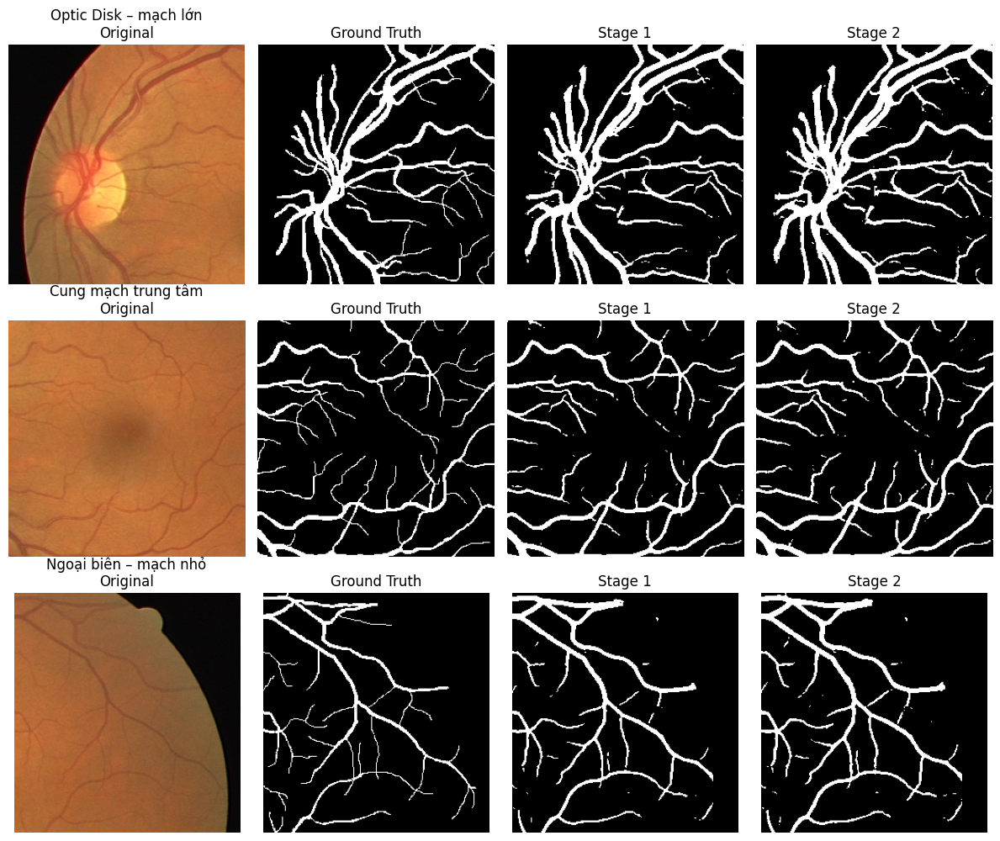

In [44]:
rois = analyze_rois_on_drive_example(original_image, ground_truth_image, roi_size=256)

In [51]:
def overlay_improvement_on_stage2(roi_s1, roi_s2):
    """
    Overlay vùng được Stage2 phục hồi (0→1) bằng màu xanh lên ảnh Stage2.
    """
    s1 = (roi_s1 > 0).astype(np.uint8)
    s2 = (roi_s2 > 0).astype(np.uint8)

    # vùng mạch mà Stage2 thêm vào (Stage1=0, Stage2=1)
    added = (s2 == 1) & (s1 == 0)

    # Stage2 sang RGB để tô màu
    stage2_rgb = cv2.cvtColor(roi_s2, cv2.COLOR_GRAY2RGB)

    # tô xanh lá
    stage2_rgb[added] = (0, 255, 0)

    return stage2_rgb

def analyze_rois_on_drive_example(
    original_image_bgr,
    ground_truth_image,
    roi_size=256
):
    """
    Hiển thị 2 cột: Stage1 và Stage2 overlay xanh trên 3 vùng ROI.
    """

    fundus_rgb = cv2.cvtColor(original_image_bgr, cv2.COLOR_BGR2RGB)
    fundus_pil = Image.fromarray(fundus_rgb)

    _, stage1_pil, stage2_pil = run_pipeline(fundus_pil)

    stage1_bin = np.array(stage1_pil)
    stage2_bin = np.array(stage2_pil)

    H, W = ground_truth_image.shape

    # tọa độ ROI theo DRIVE
    centers = {
        "Optic Disk – mạch lớn":         (int(0.40 * H), int(0.22 * W)),
        "Cung mạch trung tâm":   (int(0.50 * H), int(0.50 * W)),
        "Ngoại biên – mạch nhỏ": (int(0.35 * H), int(0.80 * W)),
    }

    n_rows = len(centers)
    fig, axes = plt.subplots(n_rows, 2, figsize=(12, 4 * n_rows))

    if n_rows == 1:
        axes = np.expand_dims(axes, 0)

    for row, (name, (cy, cx)) in enumerate(centers.items()):

        # crop ROI cho cả Stage1 và Stage2
        roi_s1 = crop_roi(stage1_bin, (cy, cx), roi_size)
        roi_s2 = crop_roi(stage2_bin, (cy, cx), roi_size)

        # overlay trực tiếp lên Stage2
        roi_s2_overlay = overlay_improvement_on_stage2(roi_s1, roi_s2)

        # plot stage 1
        axes[row, 0].imshow(roi_s1, cmap='gray')
        axes[row, 0].set_title(f"{name}\nStage 1 (U-Net)")
        axes[row, 0].axis("off")

        # plot improvement of stage 2
        axes[row, 1].imshow(roi_s2_overlay)
        axes[row, 1].set_title("Stage 2 (refined) + improved (green)")
        axes[row, 1].axis("off")

    plt.tight_layout()
    plt.show()

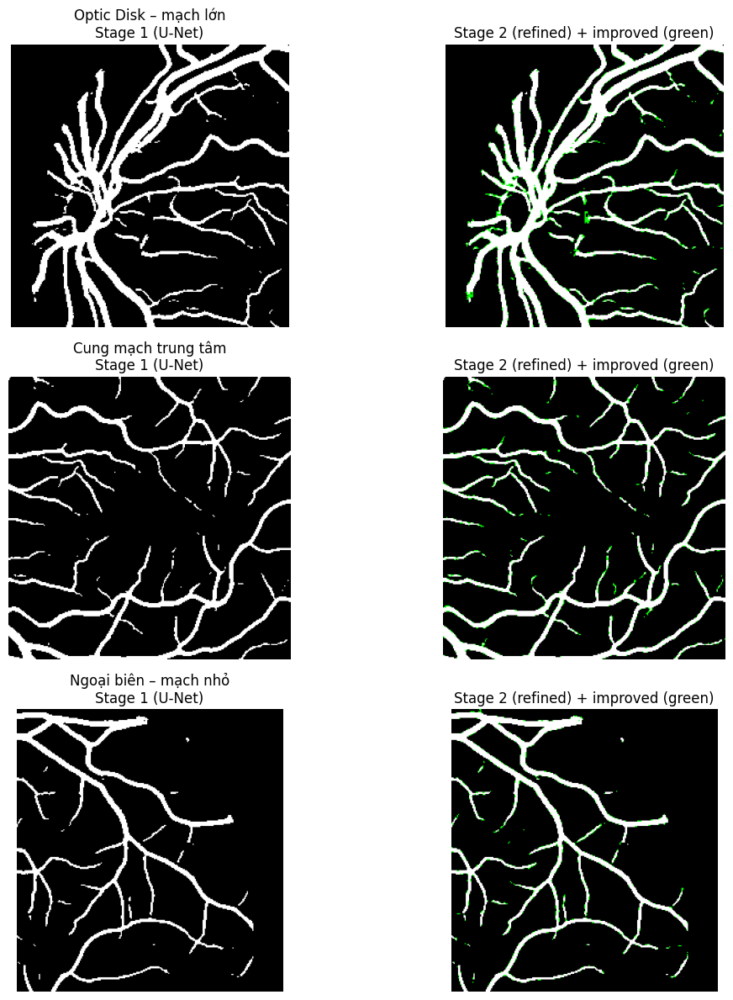

In [52]:
analyze_rois_on_drive_example(original_image, ground_truth_image, roi_size=256)